# Изучение современных нейросетевых моделей для решения задачи сегментации изображений

## В данной работе мы реализуем пакет нейросетевых методов сегментации, изучив архитектуры исследуемых моделей, проверим работу изученных моделей на практике и проведём исследования по сравнению качества и точности распознавания различных классов с помощью метрик точности на тестовых изображениях. 

### Установка необходимых библиотек

In [1]:
import time
import numpy as np
import matplotlib.pyplot as plt
import requests
from io import BytesIO
from PIL import Image
import torch
import torch.nn.functional as F
from torch import nn
from sklearn.cluster import MeanShift as SkMeanShift
from torch.distributions import MultivariateNormal
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation
from ultralytics import SAM
import torchvision
from torchvision import transforms
import torchvision.transforms as T
from transformers import OneFormerProcessor, OneFormerForUniversalSegmentation
from transformers import Mask2FormerImageProcessor, Mask2FormerForUniversalSegmentation
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation
from transformers import AutoImageProcessor, AutoModelForSemanticSegmentation
import segmentation_models_pytorch as smp
from scipy.ndimage import zoom
from huggingface_hub import hf_hub_download, list_repo_files

/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Here we load the model as well as the image processor from the HuggingFace Hub. Note that NVIDIA has released several checkpoints, all of which can be found here. Be sure to play around with them!

The image processor can be used to prepare images for the model, and postprocess the results.

We move the model to GPU if it's available.

In [2]:
if torch.cuda.is_available():
    print("cuda")
else:
    print("cpu")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

cuda


In [3]:
print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

GPU Memory: 21.00 GB


/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/torch/cuda/__init__.py:734: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


In [ ]:
# 1. Инициализация
model_name = "nvidia/segformer-b5-finetuned-ade-640-640" # Официальный ID модели[citation:1][citation:5]
local_model_path = "/home/yamshchikov/ML_practice/models/segformer-b5" # путь

# 2. Сначала попробуем загрузить локально (быстрый путь)
try:
    processor = SegformerImageProcessor.from_pretrained(local_model_path)
    model = SegformerForSemanticSegmentation.from_pretrained(local_model_path)
    print("✓ Модель успешно загружена из локального кэша.")
except OSError:
    print("Модель не найдена локально. Продолжаем...")

### For visualizing classes we will use palette for ADE20K dataset

Finally, let's visualize the segmentation map as predicted by the model. Semantic segmentation datasets typically define what is called a "color palette", that defines the RGB color values to use for each of the classes.

The ADE20k dataset consists of 150 classes, so the list below has 150 elements.

In [4]:
def ade_palette():
    """ADE20K palette that maps each class to RGB values."""
    return [[120, 120, 120], [180, 120, 120], [6, 230, 230], [80, 50, 50],
            [4, 200, 3], [120, 120, 80], [140, 140, 140], [204, 5, 255],
            [230, 230, 230], [4, 250, 7], [224, 5, 255], [235, 255, 7],
            [150, 5, 61], [120, 120, 70], [8, 255, 51], [255, 6, 82],
            [143, 255, 140], [204, 255, 4], [255, 51, 7], [204, 70, 3],
            [0, 102, 200], [61, 230, 250], [255, 6, 51], [11, 102, 255],
            [255, 7, 71], [255, 9, 224], [9, 7, 230], [220, 220, 220],
            [255, 9, 92], [112, 9, 255], [8, 255, 214], [7, 255, 224],
            [255, 184, 6], [10, 255, 71], [255, 41, 10], [7, 255, 255],
            [224, 255, 8], [102, 8, 255], [255, 61, 6], [255, 194, 7],
            [255, 122, 8], [0, 255, 20], [255, 8, 41], [255, 5, 153],
            [6, 51, 255], [235, 12, 255], [160, 150, 20], [0, 163, 255],
            [140, 140, 140], [250, 10, 15], [20, 255, 0], [31, 255, 0],
            [255, 31, 0], [255, 224, 0], [153, 255, 0], [0, 0, 255],
            [255, 71, 0], [0, 235, 255], [0, 173, 255], [31, 0, 255],
            [11, 200, 200], [255, 82, 0], [0, 255, 245], [0, 61, 255],
            [0, 255, 112], [0, 255, 133], [255, 0, 0], [255, 163, 0],
            [255, 102, 0], [194, 255, 0], [0, 143, 255], [51, 255, 0],
            [0, 82, 255], [0, 255, 41], [0, 255, 173], [10, 0, 255],
            [173, 255, 0], [0, 255, 153], [255, 92, 0], [255, 0, 255],
            [255, 0, 245], [255, 0, 102], [255, 173, 0], [255, 0, 20],
            [255, 184, 184], [0, 31, 255], [0, 255, 61], [0, 71, 255],
            [255, 0, 204], [0, 255, 194], [0, 255, 82], [0, 10, 255],
            [0, 112, 255], [51, 0, 255], [0, 194, 255], [0, 122, 255],
            [0, 255, 163], [255, 153, 0], [0, 255, 10], [255, 112, 0],
            [143, 255, 0], [82, 0, 255], [163, 255, 0], [255, 235, 0],
            [8, 184, 170], [133, 0, 255], [0, 255, 92], [184, 0, 255],
            [255, 0, 31], [0, 184, 255], [0, 214, 255], [255, 0, 112],
            [92, 255, 0], [0, 224, 255], [112, 224, 255], [70, 184, 160],
            [163, 0, 255], [153, 0, 255], [71, 255, 0], [255, 0, 163],
            [255, 204, 0], [255, 0, 143], [0, 255, 235], [133, 255, 0],
            [255, 0, 235], [245, 0, 255], [255, 0, 122], [255, 245, 0],
            [10, 190, 212], [214, 255, 0], [0, 204, 255], [20, 0, 255],
            [255, 255, 0], [0, 153, 255], [0, 41, 255], [0, 255, 204],
            [41, 0, 255], [41, 255, 0], [173, 0, 255], [0, 245, 255],
            [71, 0, 255], [122, 0, 255], [0, 255, 184], [0, 92, 255],
            [184, 255, 0], [0, 133, 255], [255, 214, 0], [25, 194, 194],
            [102, 255, 0], [92, 0, 255]]

### Модель 1: SegFormer

SegFormer represents a pivotal shift in how semantic segmentation is approached, blending the global context modeling of Transformers with the efficiency of lightweight MLPs. Unlike earlier models that relied on heavy convolutional architectures or complex decoders, SegFormer introduces a clean, simple design that excels across diverse environments.

Developed by researchers at NVIDIA, SegFormer bridges the gap between accuracy, speed, and generalization with a revolutionary encoder-decoder design, delivering up to 84.0% mIoU on Cityscapes and setting a new benchmark of 51.8% mIoU on ADE20K.

All while being up to 5× faster and 4× smaller than earlier Transformer counterparts like SETR.

### **Example of SegFormer Semantics Segmentation**

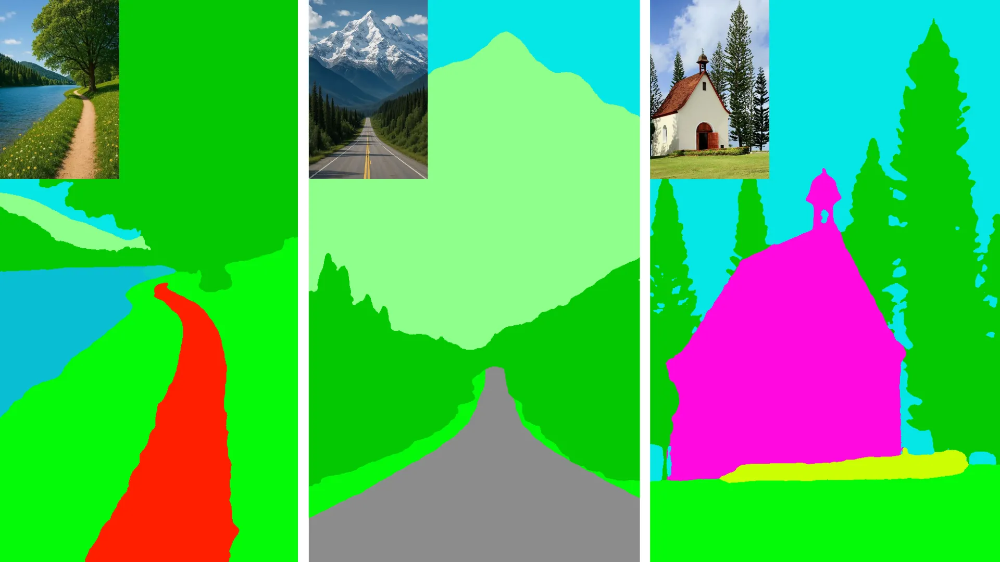

For example, imagine you're looking at a street scene: a segmentation model can tell which pixels belong to the car, which belong to the road, the sky, pedestrians, and so on the pixel level.

### **SegFormer Structure**

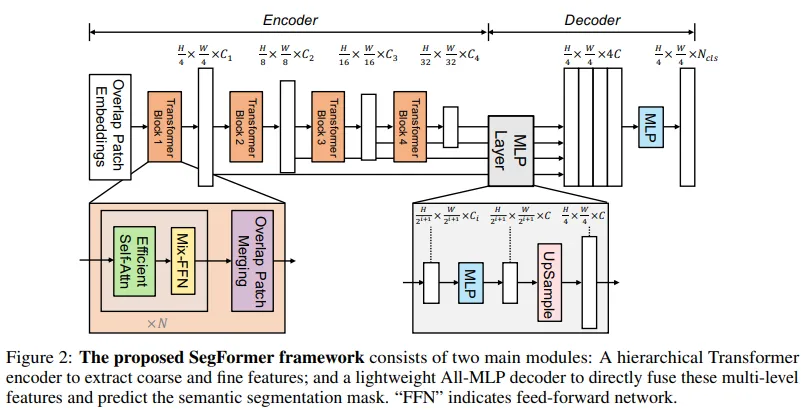

SegFormer is a modern semantic segmentation model that makes two key innovations to deliver high accuracy, speed, and robustness, all in an easy-to-use package:

1. Hierarchical, Positional-Encoding-Free Transformer Encoder
* Instead of using fixed positional embeddings (which must be interpolated at test time and can hurt performance when image sizes change), SegFormer’s encoder learns positional information implicitly via its feed-forward blocks.
* It processes an input image at four different scales so you get both fine (high-resolution) and coarse (low-resolution) feature maps, much like a CNN backbone but without handcrafted modules.
2. Lightweight All-MLP Decoder
* All it uses are simple multi-layer perceptron (MLP) layers: no complex convolutional or attention modules.
* It takes the multi-scale features from the encoder, projects them to a common channel size, upsamples to 1/4 resolution, concatenates them, and applies just two more MLPs: one for feature fusion and one to predict the final per-pixel class scores. This yields powerful representations by combining both local cues (lower layers) and global context (higher layers)

### **How does this help the model?**

* **Accuracy**: Matches or exceeds top models like SETR and DeepLabV3+, achieving up to 84.0% mIoU on Cityscapes.
* **Efficiency**: The smallest variant (SegFormer-B0) runs at ~48 FPS on high-res images with just 3.8 M parameters: ideal for real-time or edge applications.
* **Robustness**: Excels under blur, noise, weather, and lighting corruptions, making it suitable for safety-critical use cases.

### Модель 2: Mask2Former.

### Модель 3: OneFormer (multi-task универсальный фреймворк).

### Модель 4: DeepLabV3+.

### Модель 5: U-Net.

### Модель 6: MobileSAM.

### Модель 7: FastSAM.

### Инициализация основных функций

In [5]:
def create_overlay(
    image: Image.Image, 
    mask: np.ndarray, 
    alpha: float = 0.5, 
    palette=None
) -> Image.Image:
    """
    Создаёт визуализацию: оригинал + цветная маска.
    
    Args:
        image: PIL.Image в RGB
        mask: np.ndarray [H, W] с целочисленными метками классов
        alpha: коэффициент блендинга (0 = только фото, 1 = только маска)
        palette: список цветов [R,G,B] для каждого класса (по умолчанию ADE20K)
    
    Returns:
        PIL.Image с наложенной маской
    """
    if palette is None:
        palette = ade_palette()
    palette = np.array(palette, dtype=np.uint8)
    
    # Создаём цветную маску
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    
    # Присваиваем цвет каждому классу (без цикла для скорости)
    for label, color in enumerate(palette[:mask.max()+1]):
        color_mask[mask == label] = color
    
    # Блендинг
    img_arr = np.array(image.convert("RGB"))
    overlay = (img_arr * (1 - alpha) + color_mask * alpha).astype(np.uint8)
    
    return Image.fromarray(overlay)

## Перечислим функции для реализации будущего инференса разных моделей

In [36]:
def extract_logits_info(outputs, model_type: str):
    """
    Извлекает информацию о логитах из outputs модели.
    
    Returns:
        dict с информацией: shape, min, max, mean, std
    """
    try:
        # === HuggingFace модели (единый интерфейс) ===
        if model_type in ["segformer", "segformer_b2", "mask2former", "oneformer", "dpt", "upernet", "maskformer"]:
            # HuggingFace модели: outputs.logits или outputs[0]
            if hasattr(outputs, 'logits'):
                logits = outputs.logits
            elif isinstance(outputs, tuple) and len(outputs) > 0:
                logits = outputs[0] if isinstance(outputs[0], torch.Tensor) else None
            else:
                logits = None

        # === Torchvision DeepLab ===        
        elif model_type == "deeplab_tv":
            logits = outputs['out'][0] if isinstance(outputs, dict) and 'out' in outputs else None
            
         # === SMP модели (U-Net, HRNet) ===
        elif model_type in ["unet_smp", "hrnet_smp"]:
            logits = outputs if isinstance(outputs, torch.Tensor) and outputs.dim() == 4 else None
        
        # === SAM-модели (нет логитов в традиционном смысле) ===
        elif model_type in ["sam", "mobile_sam", "sam2"]:
            return {
                "type": "SAM (instance masks)", 
                "note": "No class logits — promptable instance segmentation"
            }
            
        else:
            return {"type": "unknown", "note": f"model_type={model_type}"}
        
        if logits is None:
            return {"type": "None", "note": "logits not found"}
        
        # Статистика логитов
        logits_cpu = logits.cpu().float()
        return {
            "type": type(logits).__name__,
            "shape": tuple(logits_cpu.shape),
            "min": float(torch.nanmin(logits_cpu)),
            "max": float(torch.nanmax(logits_cpu)),
            "mean": float(torch.nanmean(logits_cpu)),
            "std": float(torch.nanstd(logits_cpu)),
            "device": str(logits.device),
            "num_classes": logits_cpu.shape[1] if logits_cpu.dim() >= 4 else None
        }
        
    except Exception as e:
        return {"error": str(e), "type": "extraction_failed"}

### Модель 1: SegFormer 

In [7]:
def infer_segformer(model, processor, image, device="cuda"):
    """
    Инференс для SegFormer — возвращает маску в размере оригинального изображения (работает для B0-B5).
    """
    inputs = processor(images=image, return_tensors="pt").to(device)
    # print(inputs.shape)
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
    print(type(outputs[0]))
    logits_info = extract_logits_info(outputs, "segformer")
    print(f"📈 SegFormer logits: {logits_info}")
    # Post-process to get mask
    seg_map = processor.post_process_semantic_segmentation(
        outputs, target_sizes=[image.size[::-1]] # [H, W] = [height, width]
    )[0].cpu().numpy()
    print(seg_map)
    return seg_map, image

### Модель 2: Mask2Former 

Поддерживает семантическую, инстанс- и паноптическую сегментацию в одной модели

In [8]:
def infer_mask2former(model, processor, image, device="cuda"):
    #image = Image.open(image_path).convert("RGB")
    inputs = processor(images=image, return_tensors="pt").to(device)
    # print(inputs.shape)
    with torch.no_grad():
        outputs = model(**inputs)
    print(type(outputs[0]))
    logits_info = extract_logits_info(outputs, "mask2former")
    print(f"📈 Mask2Former logits: {logits_info}")
    
    # Пост-процессинг
    result = processor.post_process_semantic_segmentation(
        outputs, target_sizes=[image.size[::-1]]
    )[0]
    predicted_mask = result.cpu().numpy()
    print(predicted_mask)
    return predicted_mask, image

Преимущества:
Единая архитектура для всех типов сегментации 
huggingface.co
State-of-the-art результаты на ADE20K, Cityscapes
Поддержка masked attention для лучшего моделирования контекста

### Модель 3: OneFormer (multi-task универсальный фреймворк)

Обучается один раз — выполняет все задачи сегментации

In [9]:
def infer_oneformer(model, processor, image, device="cuda"):
    
    #image = Image.open(image_path).convert("RGB")
    inputs = processor(images=image, task_inputs=["semantic"], return_tensors="pt").to(device)
    # print(inputs.shape)
    with torch.no_grad():
        outputs = model(**inputs)
    print(type(outputs[0]))
    logits_info = extract_logits_info(outputs, "oneformer")
    print(f"📈 OneFormer logits: {logits_info}")
    
    # Пост-процессинг
    predicted_mask = processor.post_process_semantic_segmentation(
        outputs, target_sizes=[image.size[::-1]]
    )[0].cpu().numpy()
    print(predicted_mask)
    return predicted_mask, image

Ключевая особенность: одна модель переключается между задачами через текстовый промпт task_inputs=["semantic"|"instance"|"panoptic"]

### Модель 4: DeepLabV3+ (классика с атрюс-свёртками)

Лучший выбор для multi-scale контекста и точных границ

💡 Важно: если модель обучена на COCO (20 классов), а вы работаете с ADE20K (150 классов), используйте совместимый чекпоинт или дообучайте модель.
Почему стоит рассмотреть:
mIoU 89.3% на Cityscapes 
averroes.ai
ASPP-модуль для захвата контекста разных масштабов
Хорошо документирован, много предобученных весов

In [10]:
def infer_deeplab_torchvision(model, image, device="cuda"):
    # Preprocessing
    preprocess = T.Compose([
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    
    # Инференс (единый формат)
    input_tensor = preprocess(image).unsqueeze(0).to(device)
    
    with torch.no_grad():
        raw_output = model(input_tensor)  # dict with 'out'
    
    logits_info = extract_logits_info(raw_output, "deeplab_tv")
    print(f"📈 DeepLabV3+ logits: {logits_info}")
    
    # Пост-процессинг: argmax по классам + ресайз
    output = raw_output['out'][0]  # [C, H, W]
    predicted_mask = output.argmax(0).cpu().numpy()  # [H, W]
    
    # Ресайз к оригиналу при необходимости
    if predicted_mask.shape != image.size[::-1]:
        sh, sw = image.size[1]/predicted_mask.shape[0], image.size[0]/predicted_mask.shape[1]
        predicted_mask = zoom(predicted_mask, (sh, sw), order=0)
    print(predicted_mask)
    return predicted_mask, image

### Модель 5: U-Net (медицинская сегментация и малые датасеты)

In [11]:
def infer_unet_smp(model, image, encoder_name="resnet34", device="cuda"):
    
    preprocess_fn = smp.encoders.get_preprocessing_fn(encoder_name, "imagenet")
    
    image_np = np.array(image)
    
    # Preprocessing
    input_tensor = preprocess_fn(image_np)
    input_tensor = torch.from_numpy(input_tensor).permute(2, 0, 1).float().unsqueeze(0).to(device)
    # print(input_tensor.shape)
    
    with torch.no_grad():
        outputs = model(input_tensor)  # [B, C, H, W]
    print(type(outputs[0]))
    logits_info = extract_logits_info(outputs, "unet_smp")
    print(f"📈 U-Net logits: {logits_info}")
    
    # Пост-процессинг: argmax + ресайз к оригиналу
    predicted_mask = outputs.argmax(1).squeeze(0).cpu().numpy()  # [H, W]
    
    # Если модель работала на ресайзнутом изображении — интерполируем к оригиналу:
    if predicted_mask.shape != image.size[::-1]:
        sh, sw = image.size[1]/predicted_mask.shape[0], image.size[0]/predicted_mask.shape[1]
        predicted_mask = zoom(predicted_mask, (sh, sw), order=0)
    print(predicted_mask)
    return predicted_mask, image

Идеально для:
Медицинских изображений (МРТ, КТ, гистология)
Датасетов < 1000 изображений
Задач с чёткими границами объектов
💡 Совет: для U-Net всегда явно контролируйте размер входа/выхода — архитектура чувствительна к кратности 32/64 из-за даунсемплинга.

### Модель 6-7: MobileSAM / FastSAM (лёгкие модели для edge-устройств)

В 60 раз легче оригинального SAM, ~10 мс инференс
⚠️ Эти модели изначально для инстанс-сегментации, но их можно адаптировать под семантическую задачу путём объединения масок по классам.

In [12]:
def infer_sam(model, image, device="cuda"):
    img_w, img_h = image.size
    
    # Инференс (без prompts=None!)
    results = model(image)
    # print(results.shape)
    
    print(f"📈 MobileSAM: instance segmentation (no class logits)")
    if results[0].masks is not None:
        print(f"   Masks: {results[0].masks.data.shape}, conf: {results[0].boxes.conf if hasattr(results[0], 'boxes') else 'N/A'}")
    # Создаём семантическую карту из инстанс-масок
    seg_map = np.zeros((img_h, img_w), dtype=np.uint8)
    
    if results[0].masks is not None:
        masks = results[0].masks.data.cpu().numpy()
        for i, mask in enumerate(masks, start=1):
            # mask имеет форму (H_mask, W_mask) — обычно меньше оригинала
            mask_bin = (mask > 0.5).astype(np.uint8)
            mask_pil = Image.fromarray(mask_bin)
            # Ресайз: image.size = (width, height) — именно так ждёт resize()
            mask_resized = np.array(mask_pil.resize((img_w, img_h), Image.NEAREST))
            # Заполняем только пустые пиксели (избегаем перекрытия)
            empty = (seg_map == 0)
            # Теперь размеры совпадают: seg_map[H,W] и mask_resized[H,W]
            seg_map[empty & (mask_resized > 0)] = i
    print(seg_map) # [H, W], dtype=uint8
    return seg_map, image

### Модель 8: DPT (Dense Prediction Transformer) от Intel

In [13]:
def infer_dpt(model, processor, image: Image.Image, device="cuda"):
    inputs = processor(images=image, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)
    print(type(outputs[0]))
    logits_info = extract_logits_info(outputs, "dpt")
    print(f"📈 DPT logits: {logits_info}")
    
    print(f"📈 DPT logits: {outputs.logits.shape if hasattr(outputs, 'logits') else 'N/A'}")
    seg_map = processor.post_process_semantic_segmentation(
        outputs, target_sizes=[image.size[::-1]]
    )[0].cpu().numpy()
    return seg_map, image

### Модель 9: UPerNet с ConvNeXt-бэкбоном

### Модель 10: SegFormer-B2 (лёгкая версия для сравнения скорости)

### Модель 11: MaskFormer (предшественник Mask2Former)

### Модель 12: HRNet (High-Resolution Network)

In [14]:
def infer_smp_model(model, image: Image.Image, device="cuda", output_stride: int = 32, log_logits: bool = True):
    """
    Универсальный инференс для SMP-моделей (U-Net, FPN, PSPNet, DeepLabV3+)
    с авто-паддингом под output_stride.
    
    Args:
        output_stride: кратность размера (32 для FPN/DeepLab, 8 для PSPNet, 1 для U-Net)
    """
    import segmentation_models_pytorch as smp
    import torch
    import numpy as np
    from PIL import Image as PILImage
    
    orig_w, orig_h = image.size
    
    # Preprocessing
    # Получаем encoder_name из модели (если возможно) или используем дефолт
    try:
        encoder_name = model.encoder.name
    except:
        encoder_name = "mit_b5"  # fallback
    
    preprocess_fn = smp.encoders.get_preprocessing_fn(encoder_name, "imagenet")
    
    # Конвертация + препроцессинг
    image_np = np.array(image)
    input_tensor = preprocess_fn(image_np)
    input_tensor = torch.from_numpy(input_tensor).permute(2, 0, 1).float()
    
    # 🔧 ПАДДИНГ под output_stride
    if output_stride > 1:
        h, w = input_tensor.shape[1], input_tensor.shape[2]
        pad_h = (output_stride - h % output_stride) % output_stride
        pad_w = (output_stride - w % output_stride) % output_stride
        
        if pad_h > 0 or pad_w > 0:
            input_tensor = torch.nn.functional.pad(
                input_tensor, 
                (0, pad_w, 0, pad_h),  # left, right, top, bottom
                mode='reflect'  # или 'constant', value=0
            )
    
    # Добавляем batch dimension и переносим на device
    input_tensor = input_tensor.unsqueeze(0).to(device)
    
    # Инференс
    with torch.no_grad():
        outputs = model(input_tensor)  # [B, C, H_pad, W_pad]
    
    if log_logits:
        logits_info = extract_logits_info(outputs, "smp")
        print(f"📈 SMP logits: {logits_info}")
    
    # Пост-процессинг: argmax + кроппинг к оригиналу
    pred_mask = outputs.argmax(1).squeeze(0).cpu().numpy()  # [H_pad, W_pad]
    
    # 🔧 КРОППИНГ к оригинальному размеру
    if output_stride > 1 and (pad_h > 0 or pad_w > 0):
        pred_mask = pred_mask[:orig_h, :orig_w]
    
    return pred_mask, image

In [15]:
def segment_image_unified(model, processor, image_input, model_type: str, 
                          alpha: float = 0.5, palette=None, device="cuda"):
    """
    Универсальная функция сегментации для любой архитектуры.
    
    Args:
        model: загруженная модель
        processor: процессор (для HF-моделей) или None
        image_input: путь к файлу, URL или PIL.Image
        model_type: "mask2former" | "oneformer" | "deeplab_tv" | "unet_smp" | "sam"
        alpha: прозрачность маски (0..1)
        palette: палитра цветов (по умолчанию ADE20K)
    
    Returns:
        PIL.Image с наложенной маской

    Поддерживаемые model_type:
    - "segformer", "segformer_b2" — SegFormer B0-B5
    - "mask2former", "oneformer", "maskformer" — Universal HF-модели
    - "dpt", "upernet" — Hybrid/FPN HF-модели
    - "deeplab_tv" — Torchvision DeepLab
    - "unet_smp", "hrnet_smp" — SMP модели
    - "sam", "mobile_sam", "sam2" — SAM-семейство
    """
    
    # Загрузка изображения
    if isinstance(image_input, str):
        if image_input.startswith(('http://', 'https://')):
            resp = requests.get(image_input)
            image = Image.open(BytesIO(resp.content)).convert("RGB")
        else:
            image = Image.open(image_input).convert("RGB")
    elif isinstance(image_input, Image.Image):
        image = image_input.convert("RGB")
    else:
        raise ValueError("Unsupported input type: provide path, URL, or PIL.Image")
    
    # Инференс в зависимости от типа модели
    if model_type == "mask2former" or model_type == "maskformer":
        mask, _ = infer_mask2former(model, processor, image, device)
    elif model_type in ["segformer", "segformer_b2"]:
        mask, _ = infer_segformer(model, processor, image, device)
    elif model_type == "oneformer":
        mask, _ = infer_oneformer(model, processor, image, device)
    elif model_type == "dpt":
        mask, _ = infer_dpt(model, processor, image, device)
    elif model_type == "upernet":
        mask, _ = infer_mask2former(model, processor, image, device)  # Совместимый API
    elif model_type == "deeplab_tv":
        mask, _ = infer_deeplab_torchvision(model, image, device)
    # === SMP модели с разными output_stride ===
    elif model_type == "unet_smp" or model_type == "mit_smp":
        # U-Net: output_stride = 1 (любой размер)
        mask, _ = infer_smp_model(model, image, device, output_stride=1)
    elif model_type in ["fpn_mit", "fpn_effnet", "fpn_se_resnext"]:
        # FPN: output_stride = 32
        mask, _ = infer_smp_model(model, image, device, output_stride=32)
    elif model_type in ["psp_mit", "psp_effnet", "psp_resnet"]:
        # PSPNet: output_stride = 8
        mask, _ = infer_smp_model(model, image, device, output_stride=8)
    elif model_type == "deeplab_smp":
        # DeepLabV3+: output_stride = 16 или 32
        mask, _ = infer_smp_model(model, image, device, output_stride=16)
    elif model_type in ["sam", "mobile_sam", "sam2"]:
        mask, _ = infer_sam(model, image, device)
    else:
        raise ValueError(f"Unknown model_type: {model_type}")
    
    # Визуализация
    return create_overlay(image, mask, alpha=alpha, palette=palette)

In [16]:
import numpy as np
import torch
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

def compute_metrics(pred_mask: np.ndarray, gt_mask: np.ndarray, num_classes: int, ignore_index: int = 255):
    """
    Вычисляет основные метрики семантической сегментации.
    
    Args:
        pred_mask: [H, W] предсказанные метки классов
        gt_mask: [H, W] ground truth метки
        num_classes: общее число классов
        ignore_index: индекс для игнорируемых пикселей (фон/неизвестно)
    
    Returns:
        dict с метриками
    """
    # Маска валидных пикселей
    valid = (gt_mask != ignore_index)
    
    if not np.any(valid):
        return {
            "mIoU": np.nan, 
            "pixel_acc": np.nan, 
            "f1_weighted": np.nan,
            "per_class_iou": [np.nan] * num_classes,
            "confusion_matrix": None,
            "unique_pred_classes": len(np.unique(pred_mask)),
            "valid_pixels": 0
        }
    
    pred_valid = pred_mask[valid]
    gt_valid = gt_mask[valid]

    # 🔧 Проверка: значения в ground truth должны быть в диапазоне [0, num_classes-1]
    gt_min, gt_max = gt_valid.min(), gt_valid.max()
    if gt_min < 0 or gt_max >= num_classes:
        print(f"⚠️ Warning: gt_mask values out of range [{gt_min}, {gt_max}], expected [0, {num_classes-1}]")
        # Клиппим значения
        gt_valid = np.clip(gt_valid, 0, num_classes - 1)
    
    # Pixel Accuracy
    pixel_acc = accuracy_score(gt_valid, pred_valid)
    
    # Confusion matrix
    cm = confusion_matrix(gt_valid, pred_valid, labels=range(num_classes))
    
    # Per-class IoU
    iou_per_class = []
    for c in range(num_classes):
        tp = cm[c, c]
        fp = cm[:, c].sum() - tp
        fn = cm[c, :].sum() - tp
        if tp + fp + fn == 0:
            iou_per_class.append(np.nan)
        else:
            iou_per_class.append(tp / (tp + fp + fn))
    
    # Mean IoU (игнорируем NaN для классов без пикселей)
    mIoU = np.nanmean(iou_per_class)
    
    # Weighted F1-score
    f1 = f1_score(gt_valid, pred_valid, average='weighted', labels=range(num_classes), zero_division=0)
    
    return {
        "mIoU": mIoU,
        "pixel_acc": pixel_acc,
        "f1_weighted": f1,
        "per_class_iou": np.array(iou_per_class),
        "confusion_matrix": cm,
        "unique_pred_classes": len(np.unique(pred_mask)),
        "valid_pixels": np.sum(valid)
    }

Когда использовать:
Реальное время на мобильных устройствах
Прототипирование и демонстрации
Задачи, где скорость важнее предельной точности
🔁 Для истинной семантической сегментации (классы "дорога", "дерево" и т.д.) MobileSAM требует дообучения классификатора поверх масок или использования в связке с CLIP для zero-shot классификации регионов.

## **Inference result**

In [23]:
model_name = "shi-labs/oneformer_ade20k_swin_large"
files = list_repo_files(model_name)

print("✅ safetensors found!" if any(f.endswith(".safetensors") for f in files) else "❌ Только pickle (.bin)")
print([f for f in files if f.endswith((".safetensors", ".bin"))])

❌ Только pickle (.bin)
['pytorch_model.bin']


📊 Сравнительная таблица архитектур
Модель
mIoU (ADE20K)
Params
Inference (A100)
Лучше всего для
SegFormer-B5
~51.0%
137M
~45 ms
Баланс точности/скорости 
huggingface.co
Mask2Former
~56.4%
60M
~80 ms
Универсальные задачи 
debuggercafe.com
OneFormer
~57.1%
190M
~120 ms
Multi-task обучение 
GitHub
DeepLabV3+
~45.7%
59M
~35 ms
Классические CV-задачи 
averroes.ai
U-Net (ResNet34)
~42.1%
31M
~25 ms
Медицина, малые данные 
medium.com
MobileSAM
~48.2%*
10M
~10 ms
Edge-устройства, real-time 
docs.ultralytics.com
* оценка на подмножестве, т.к. SAM изначально для zero-shot

Практический шаблон для сравнения моделей

Метрики для оценки (помимо mIoU):

In [ ]:
# import evaluate
# metric = evaluate.load("mean_iou")

# # Убедитесь, что predicted_mask и ground_truth имеют одинаковый размер и dtype
# results = metric.compute(
#     predictions=predicted_mask,
#     references=ground_truth_mask,
#     num_labels=num_classes,
#     ignore_index=255  # если есть фон/игнорируемые пиксели
# )
# print(f"mIoU: {results['mean_iou']:.4f}")

Оптимизация памяти: для больших моделей используйте:

In [ ]:
# from accelerate import Accelerator
# accelerator = Accelerator()
# model = accelerator.prepare(model)  # автоматическое распределение

✅ Для воспроизводимости:

In [ ]:
# torch.manual_seed(42)
# np.random.seed(42)
# if torch.cuda.is_available():
#     torch.cuda.manual_seed_all(42)

### 🎯 Универсальный шаблон для сравнения (готов к бенчмарку)

SegformerImageProcessor {
  "do_normalize": true,
  "do_reduce_labels": false,
  "do_rescale": true,
  "do_resize": false,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "SegformerImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 512,
    "width": 512
  }
}

SegformerForSemanticSegmentation(
  (segformer): SegformerModel(
    (encoder): SegformerEncoder(
      (patch_embeddings): ModuleList(
        (0): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
          (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        )
        (1): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        )
        (2): SegformerOverlapPa

/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `Mask2FormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)


Mask2FormerImageProcessor {
  "do_normalize": true,
  "do_reduce_labels": false,
  "do_rescale": true,
  "do_resize": true,
  "ignore_index": 255,
  "image_mean": [
    0.48500001430511475,
    0.4560000002384186,
    0.4059999883174896
  ],
  "image_processor_type": "Mask2FormerImageProcessor",
  "image_std": [
    0.2290000021457672,
    0.2239999920129776,
    0.22499999403953552
  ],
  "num_labels": 150,
  "pad_size": null,
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 384,
    "width": 384
  },
  "size_divisor": 32
}

Mask2FormerForUniversalSegmentation(
  (model): Mask2FormerModel(
    (pixel_level_module): Mask2FormerPixelLevelModule(
      (encoder): SwinBackbone(
        (embeddings): SwinEmbeddings(
          (patch_embeddings): SwinPatchEmbeddings(
            (projection): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
          )
          (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
          (dropout): Dropout(p=0

/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `OneFormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)


OneFormerProcessor:
- image_processor: OneFormerImageProcessor {
  "class_info_file": "ade20k_panoptic.json",
  "do_normalize": true,
  "do_reduce_labels": false,
  "do_rescale": true,
  "do_resize": true,
  "ignore_index": 255,
  "image_mean": [
    0.48500001430511475,
    0.4560000002384186,
    0.4059999883174896
  ],
  "image_processor_type": "OneFormerImageProcessor",
  "image_std": [
    0.2290000021457672,
    0.2239999920129776,
    0.22499999403953552
  ],
  "metadata": {
    "0": "wall",
    "1": "building",
    "10": "cabinet",
    "100": "poster, posting, placard, notice, bill, card",
    "101": "stage",
    "102": "van",
    "103": "ship",
    "104": "fountain",
    "105": "conveyer belt, conveyor belt, conveyer, conveyor, transporter",
    "106": "canopy",
    "107": "washer, automatic washer, washing machine",
    "108": "plaything, toy",
    "109": "pool",
    "11": "sidewalk, pavement",
    "110": "stool",
    "111": "barrel, cask",
    "112": "basket, handbasket",
  

/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


<class 'torch.Tensor'>
📈 OneFormer logits: {'type': 'None', 'note': 'logits not found'}
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [9 9 9 ... 6 6 6]
 [9 9 9 ... 6 6 6]
 [9 9 9 ... 6 6 6]]
Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stat

/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

Some weights of DPTForSemanticSegmentation were not initialized from the model checkpoint at Intel/dpt-large-ade and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.batch_norm1.bias', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.num_batches_tracked', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.running_mean', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.running_var', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.weight', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.bias', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.num_batches_tracked', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.running_mean', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.running_var', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight']
You should probably TRAIN this mo

<class 'torch.Tensor'>
📈 DPT logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
📈 DPT logits: torch.Size([1, 150, 480, 480])


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


<class 'torch.Tensor'>
📈 Mask2Former logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [9 9 9 ... 6 6 6]
 [9 9 9 ... 6 6 6]
 [9 9 9 ... 6 6 6]]


/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `SegformerImageProcessor.__init__` and were ignored: 'feature_extractor_type', 'reduce_labels'
  image_processor = cls(**image_processor_dict)


<class 'torch.Tensor'>
📈 SegFormer logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [9 9 9 ... 6 6 6]
 [9 9 9 ... 6 6 6]
 [9 9 9 ... 6 6 6]]


/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `MaskFormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)


<class 'torch.Tensor'>
📈 Mask2Former logits: {'type': 'None', 'note': 'logits not found'}
[[ 2  2  2 ...  2  2  2]
 [ 2  2  2 ...  2  2  2]
 [ 2  2  2 ...  2  2  2]
 ...
 [12 12 12 ...  4  4  4]
 [12 12 12 ...  4  4  4]
 [12 12 12 ...  4  4  4]]
✅ FPN + MiT-B5 loaded (output_stride=32)
📈 SMP logits: {'type': 'unknown', 'note': 'model_type=smp'}
✅ PSPNet + MiT-B5 loaded (output_stride=8)
📈 SMP logits: {'type': 'unknown', 'note': 'model_type=smp'}


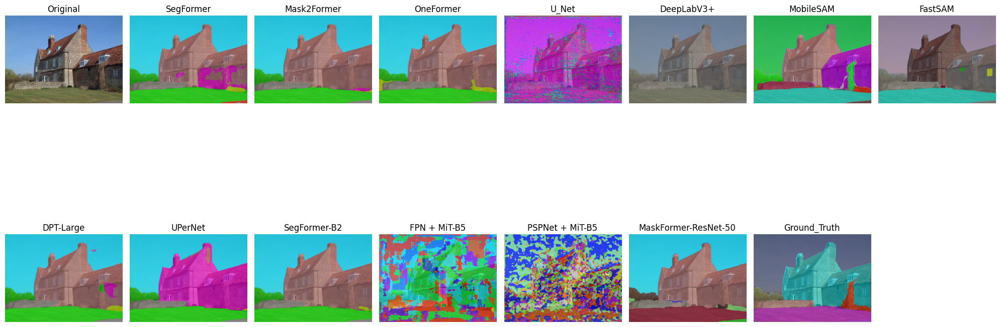

In [17]:
# Example usage 1:
repo_id = "hf-internal-testing/fixtures_ade20k"
image_path = hf_hub_download(repo_id=repo_id, filename="ADE_val_00000001.jpg", repo_type="dataset")
original_img_0 = Image.open(image_path)
original_img_0.save("original_image_0.jpg")
segmentation_map_path = hf_hub_download(repo_id=repo_id, filename="ADE_val_00000001.png", repo_type="dataset")
segmentation_map = Image.open(segmentation_map_path)

# === SegFormer ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
local_model_path = "/home/yamshchikov/models/segformer-b5-ready"
processor = SegformerImageProcessor(do_resize=False)
model = SegformerForSemanticSegmentation.from_pretrained(local_model_path).to(device)
print(processor)
print(model)

print(f"✅ Модель успешно загружена с локального пути!")
print(f"   Путь: {local_model_path}")
print(f"   Устройство: {device}")
print(model.config)

result_segf_0 = segment_image_unified(model, processor, original_img_0, "segformer", alpha=0.6)
result_segf_0.save("segmented_segformer_0.jpg")

# === Mask2Former ===
device = "cuda"
model_name = "facebook/mask2former-swin-base-ade-semantic"
processor = Mask2FormerImageProcessor.from_pretrained(model_name)
model = Mask2FormerForUniversalSegmentation.from_pretrained(model_name).to(device)
print(processor)
print(model)

result_m2f_0 = segment_image_unified(model, processor, original_img_0, "mask2former", alpha=0.6)
result_m2f_0.save("segmented_mask2former_0.jpg")

# === OneFormer ===
model_name = "shi-labs/oneformer_ade20k_swin_large"
processor = OneFormerProcessor.from_pretrained(model_name)
model = OneFormerForUniversalSegmentation.from_pretrained(model_name).to(device)
print(processor)
print(model)

result_of_0 = segment_image_unified(model, processor, original_img_0, "oneformer", alpha=0.6)
result_of_0.save("segmented_oneformer_0.jpg")

# === UNet ===
model_unet = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,  # под ваш датасет (ADE20K = 150)
    activation=None  # None для raw logits
).to(device).eval()
print(model_unet)
result_unet_0 = segment_image_unified(model_unet, None, original_img_0, "unet_smp", alpha=0.6)
result_unet_0.save("segmented_U_Net_0.jpg")


# === DeepLabV3+ (torchvision) ===
model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True).to(device).eval()
print(model)
result_dl_0 = segment_image_unified(model, None, original_img_0, "deeplab_tv", alpha=0.6)
result_dl_0.save("segmented_deeplab_0.jpg")

# === MobileSAM ===
model = SAM("mobile_sam.pt")
print(model)
result_mob_sam_0 = segment_image_unified(model, None, original_img_0, "mobile_sam", alpha=0.6)
result_mob_sam_0.save("segmented_mob_sam_0.jpg")

# === SAM2 ===
model = SAM("sam2_t.pt")  # или "sam2_b.pt"
print(model)
result_fast_sam_0 = segment_image_unified(model, None, original_img_0, "sam2", alpha=0.6)
result_mob_sam_0.save("segmented_sam2_0.jpg")

from transformers import DPTImageProcessor, DPTForSemanticSegmentation

# === DPT-Large ===
model_name = "Intel/dpt-large-ade"  # ✅ safetensors, работает с PyTorch 2.6+
processor = DPTImageProcessor.from_pretrained(model_name)
model = DPTForSemanticSegmentation.from_pretrained(model_name).to(device)

result_dpt_0 = segment_image_unified(model, processor, original_img_0, "dpt", alpha=0.6)
result_dpt_0.save("segmented_dpt_0.jpg")

from transformers import AutoImageProcessor, AutoModelForSemanticSegmentation

# === UPerNet-ConvNeXt ===
model_name = "openmmlab/upernet-convnext-small"  # ✅ safetensors
processor = AutoImageProcessor.from_pretrained(model_name)
model = AutoModelForSemanticSegmentation.from_pretrained(model_name).to(device)

result_upernet_0 = segment_image_unified(model, processor, original_img_0, "upernet", alpha=0.6)
result_upernet_0.save("segmented_upernet_0.jpg")

from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation

# === SegFormer-B2 (быстрее B5) ===
model_name = "nvidia/segformer-b2-finetuned-ade-512-512"  # ✅ safetensors
processor = SegformerImageProcessor.from_pretrained(model_name)
model = SegformerForSemanticSegmentation.from_pretrained(model_name).to(device)

result_segf_b2_0 = segment_image_unified(model, processor, original_img_0, "segformer_b2", alpha=0.6)
result_segf_b2_0.save("segmented_segformer_b2_0.jpg")

from transformers import MaskFormerImageProcessor, MaskFormerForInstanceSegmentation

# === MaskFormer-ResNet-50 ===
model_name = "facebook/maskformer-resnet50-ade20k-full"
processor = MaskFormerImageProcessor.from_pretrained(model_name)
model = MaskFormerForInstanceSegmentation.from_pretrained(model_name).to(device)

result_mf_0 = segment_image_unified(model, processor, original_img_0, "maskformer", alpha=0.6)
result_mf_0.save("segmented_maskformer_0.jpg")

# HRNet через segmentation_models_pytorch
# === HRNet-W48 + U-Net (исправленная версия) ===
import segmentation_models_pytorch as smp

# === FPN + MiT-B5 ===
model_fpn_mit = smp.FPN(
    encoder_name="mit_b5",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,
    activation=None
).to(device).eval()

print(f"✅ FPN + MiT-B5 loaded (output_stride=32)")

# 🔧 Важно: используем model_type="fpn_mit" для правильного output_stride
result_fpn_mit_0 = segment_image_unified(model_fpn_mit, None, original_img_0, "fpn_mit", alpha=0.6)
result_fpn_mit_0.save("segmented_fpn_mit_b5_0.jpg")

# === PSPNet + MiT-B5 ===
model_psp_mit = smp.PSPNet(
    encoder_name="mit_b5",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,
    activation=None,
    psp_size=2048  # под mit_b5
).to(device).eval()

print(f"✅ PSPNet + MiT-B5 loaded (output_stride=8)")

# 🔧 Важно: model_type="psp_mit" для output_stride=8
result_psp_mit_0 = segment_image_unified(model_psp_mit, None, original_img_0, "psp_mit", alpha=0.6)
result_psp_mit_0.save("segmented_psp_mit_b5_0.jpg")

infer_res = create_overlay(original_img_0, np.array(segmentation_map), alpha=0.5, palette=ade_palette())

# === Визуализация сравнения ===
plt.figure(figsize=(20, 10))
titles = ["Original", "SegFormer","Mask2Former", "OneFormer", "U_Net", "DeepLabV3+", "MobileSAM", "FastSAM", "DPT-Large", "UPerNet", "SegFormer-B2","FPN + MiT-B5", "PSPNet + MiT-B5","MaskFormer-ResNet-50", "Ground_Truth"]
images = [original_img_0, result_segf_0, result_m2f_0, result_of_0, result_unet_0, result_dl_0, result_mob_sam_0, result_fast_sam_0, result_dpt_0, result_upernet_0, result_segf_b2_0, result_fpn_mit_0, result_psp_mit_0, result_mf_0, infer_res]

for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(2, 8, i+1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [20]:
import sys
print(f"Python executable: {sys.executable}")
print(f"Python path: {sys.path}")

import subprocess
result = subprocess.run([sys.executable, "-m", "pip", "show", "fastsam"], 
                       capture_output=True, text=True)
print(result.stdout if result.returncode == 0 else "❌ fastsam not found in this environment")

Python executable: /home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/bin/python
Python path: ['/usr/lib/python312.zip', '/usr/lib/python3.12', '/usr/lib/python3.12/lib-dynload', '', '/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages', '/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/setuptools/_vendor', '/tmp/tmptu0chq4b']
Name: fastsam
Version: 0.0.1.dev0
Summary: fastsam
Home-page: 
Author: Shadow Walker
Author-email: 
License: 
Location: /home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages
Requires: torch
Required-by: 



✅ Модель успешно загружена с локального пути!
   Путь: /home/yamshchikov/models/segformer-b5-ready
   Устройство: cuda
SegformerConfig {
  "architectures": [
    "SegformerForSemanticSegmentation"
  ],
  "attention_probs_dropout_prob": 0.0,
  "classifier_dropout_prob": 0.1,
  "decoder_hidden_size": 768,
  "depths": [
    3,
    6,
    40,
    3
  ],
  "downsampling_rates": [
    1,
    4,
    8,
    16
  ],
  "drop_path_rate": 0.1,
  "dtype": "float32",
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_sizes": [
    64,
    128,
    320,
    512
  ],
  "id2label": {
    "0": "wall",
    "1": "building",
    "2": "sky",
    "3": "floor",
    "4": "tree",
    "5": "ceiling",
    "6": "road",
    "7": "bed ",
    "8": "windowpane",
    "9": "grass",
    "10": "cabinet",
    "11": "sidewalk",
    "12": "person",
    "13": "earth",
    "14": "door",
    "15": "table",
    "16": "mountain",
    "17": "plant",
    "18": "curtain",
    "19": "chair",
    "20": "car",
    "21": "w

Some weights of DPTForSemanticSegmentation were not initialized from the model checkpoint at Intel/dpt-large-ade and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.batch_norm1.bias', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.num_batches_tracked', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.running_mean', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.running_var', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.weight', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.bias', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.num_batches_tracked', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.running_mean', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.running_var', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight']
You should probably TRAIN this mo

<class 'torch.Tensor'>
📈 DPT logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
📈 DPT logits: torch.Size([1, 150, 480, 480])
<class 'torch.Tensor'>
📈 Mask2Former logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[ 2  2  2 ...  2  2  2]
 [ 2  2  2 ...  2  2  2]
 [ 2  2  2 ...  2  2  2]
 ...
 [29 29 29 ... 29 29 29]
 [29 29 29 ... 29 29 29]
 [29 29 29 ... 29 29 29]]
<class 'torch.Tensor'>
📈 SegFormer logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[ 2  2  2 ...  2  2  2]
 [ 2  2  2 ...  2  2  2]
 [ 2  2  2 ...  2  2  2]
 ...
 [ 9  9  9 ... 29 29 29]
 [ 9  9  9 ... 29 29 29]
 [ 9  9  9 ... 29 29 29]]
<class 'torch.Tensor'>
📈 Mask2Former logits: {'type': 'None', 'note': 'logits not found'}
[[ 2  2  2 ...  2  2  2]
 [ 2  2  2 ...  2  2  2]
 [ 2  2  2 ...  2  2  2]
 ...
 [31 31 31 ... 31 31 31]
 [31 31 31 ... 31 31 31]
 [31 31 31 ... 31 31 31]]
✅ FPN + MiT-B5 loaded (

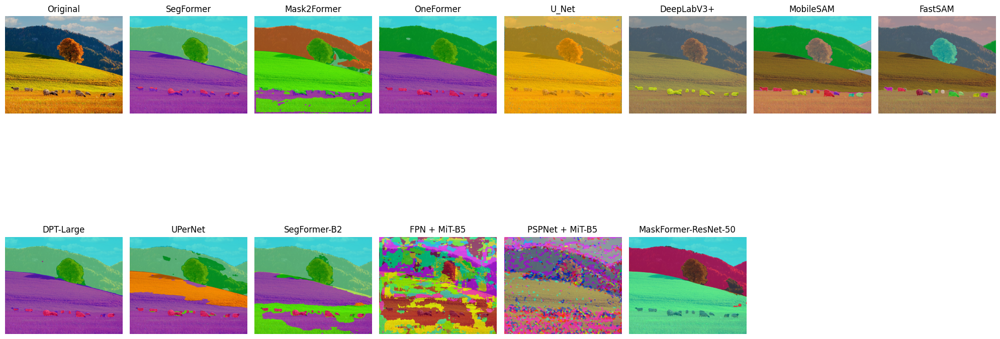

In [18]:
# Example usage 1:
img_url = "https://i.pinimg.com/736x/17/e7/fc/17e7fc299466b2afd989e709fe7c9815.jpg"

response = requests.get(img_url)
original_img = Image.open(BytesIO(response.content))
original_img.save("original_image.jpg")

# === SegFormer ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
local_model_path = "/home/yamshchikov/models/segformer-b5-ready"
processor = SegformerImageProcessor(do_resize=False)
model = SegformerForSemanticSegmentation.from_pretrained(local_model_path).to(device)

print(f"✅ Модель успешно загружена с локального пути!")
print(f"   Путь: {local_model_path}")
print(f"   Устройство: {device}")
print(model.config)

result_segf = segment_image_unified(model, processor, original_img, "segformer", alpha=0.6)
result_segf.save("segmented_segformer.jpg")

# === Mask2Former ===
device = "cuda"
model_name = "facebook/mask2former-swin-base-ade-semantic"
processor = Mask2FormerImageProcessor.from_pretrained(model_name)
model = Mask2FormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_m2f = segment_image_unified(model, processor, original_img, "mask2former", alpha=0.6)
result_m2f.save("segmented_mask2former.jpg")

# === OneFormer ===
model_name = "shi-labs/oneformer_ade20k_swin_large"
processor = OneFormerProcessor.from_pretrained(model_name)
model = OneFormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_of = segment_image_unified(model, processor, original_img, "oneformer", alpha=0.6)
result_of.save("segmented_oneformer.jpg")

# === UNet ===
model_unet = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,  # под ваш датасет (ADE20K = 150)
    activation=None  # None для raw logits
).to(device).eval()
result_unet = segment_image_unified(model_unet, None, original_img, "unet_smp", alpha=0.6)
result_unet.save("segmented_U_Net.jpg")


# === DeepLabV3+ (torchvision) ===
model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True).to(device).eval()
result_dl = segment_image_unified(model, None, original_img, "deeplab_tv", alpha=0.6)
result_dl.save("segmented_deeplab.jpg")

# === MobileSAM ===
model = SAM("mobile_sam.pt")
result_sam = segment_image_unified(model, None, original_img, "sam", alpha=0.6)
result_sam.save("segmented_sam.jpg")

# === SAM2 ===
model = SAM("sam2_t.pt")  # или "sam2_b.pt"
print(model)
result_fast_sam = segment_image_unified(model, None, original_img, "sam2", alpha=0.6)
result_fast_sam.save("segmented_sam2.jpg")

from transformers import DPTImageProcessor, DPTForSemanticSegmentation

# === DPT-Large ===
model_name = "Intel/dpt-large-ade"  # ✅ safetensors, работает с PyTorch 2.6+
processor = DPTImageProcessor.from_pretrained(model_name)
model = DPTForSemanticSegmentation.from_pretrained(model_name).to(device)

result_dpt = segment_image_unified(model, processor, original_img, "dpt", alpha=0.6)
result_dpt.save("segmented_dpt.jpg")

from transformers import AutoImageProcessor, AutoModelForSemanticSegmentation

# === UPerNet-ConvNeXt ===
model_name = "openmmlab/upernet-convnext-small"  # ✅ safetensors
processor = AutoImageProcessor.from_pretrained(model_name)
model = AutoModelForSemanticSegmentation.from_pretrained(model_name).to(device)

result_upernet = segment_image_unified(model, processor, original_img, "upernet", alpha=0.6)
result_upernet.save("segmented_upernet.jpg")

from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation

# === SegFormer-B2 (быстрее B5) ===
model_name = "nvidia/segformer-b2-finetuned-ade-512-512"  # ✅ safetensors
processor = SegformerImageProcessor.from_pretrained(model_name)
model = SegformerForSemanticSegmentation.from_pretrained(model_name).to(device)

result_segf_b2 = segment_image_unified(model, processor, original_img, "segformer_b2", alpha=0.6)
result_segf_b2.save("segmented_segformer_b2.jpg")

from transformers import MaskFormerImageProcessor, MaskFormerForInstanceSegmentation

# === MaskFormer-ResNet-50 ===
model_name = "facebook/maskformer-resnet50-ade20k-full"
processor = MaskFormerImageProcessor.from_pretrained(model_name)
model = MaskFormerForInstanceSegmentation.from_pretrained(model_name).to(device)

result_mf = segment_image_unified(model, processor, original_img, "maskformer", alpha=0.6)
result_mf.save("segmented_maskformer.jpg")

# HRNet через segmentation_models_pytorch
# === HRNet-W48 + U-Net (исправленная версия) ===
import segmentation_models_pytorch as smp

# === FPN + MiT-B5 ===
model_fpn_mit = smp.FPN(
    encoder_name="mit_b5",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,
    activation=None
).to(device).eval()

print(f"✅ FPN + MiT-B5 loaded (output_stride=32)")

# 🔧 Важно: используем model_type="fpn_mit" для правильного output_stride
result_fpn_mit = segment_image_unified(model_fpn_mit, None, original_img, "fpn_mit", alpha=0.6)
result_fpn_mit.save("segmented_fpn_mit_b5.jpg")

# === PSPNet + MiT-B5 ===
model_psp_mit = smp.PSPNet(
    encoder_name="mit_b5",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,
    activation=None,
    psp_size=2048  # под mit_b5
).to(device).eval()

print(f"✅ PSPNet + MiT-B5 loaded (output_stride=8)")

# 🔧 Важно: model_type="psp_mit" для output_stride=8
result_psp_mit = segment_image_unified(model_psp_mit, None, original_img, "psp_mit", alpha=0.6)
result_psp_mit.save("segmented_psp_mit_b5.jpg")

# === Визуализация сравнения ===
plt.figure(figsize=(20, 10))
titles = ["Original", "SegFormer","Mask2Former", "OneFormer", "U_Net", "DeepLabV3+", "MobileSAM", "FastSAM", "DPT-Large", "UPerNet", "SegFormer-B2","FPN + MiT-B5", "PSPNet + MiT-B5","MaskFormer-ResNet-50"]
images = [original_img, result_segf, result_m2f, result_of, result_unet, result_dl, result_sam, result_fast_sam, result_dpt, result_upernet, result_segf_b2, result_fpn_mit, result_psp_mit, result_mf]

for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(2, 8, i+1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

✅ Модель успешно загружена с локального пути!
   Путь: /home/yamshchikov/models/segformer-b5-ready
   Устройство: cuda
SegformerConfig {
  "architectures": [
    "SegformerForSemanticSegmentation"
  ],
  "attention_probs_dropout_prob": 0.0,
  "classifier_dropout_prob": 0.1,
  "decoder_hidden_size": 768,
  "depths": [
    3,
    6,
    40,
    3
  ],
  "downsampling_rates": [
    1,
    4,
    8,
    16
  ],
  "drop_path_rate": 0.1,
  "dtype": "float32",
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_sizes": [
    64,
    128,
    320,
    512
  ],
  "id2label": {
    "0": "wall",
    "1": "building",
    "2": "sky",
    "3": "floor",
    "4": "tree",
    "5": "ceiling",
    "6": "road",
    "7": "bed ",
    "8": "windowpane",
    "9": "grass",
    "10": "cabinet",
    "11": "sidewalk",
    "12": "person",
    "13": "earth",
    "14": "door",
    "15": "table",
    "16": "mountain",
    "17": "plant",
    "18": "curtain",
    "19": "chair",
    "20": "car",
    "21": "w

Some weights of DPTForSemanticSegmentation were not initialized from the model checkpoint at Intel/dpt-large-ade and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.batch_norm1.bias', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.num_batches_tracked', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.running_mean', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.running_var', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.weight', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.bias', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.num_batches_tracked', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.running_mean', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.running_var', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight']
You should probably TRAIN this mo

<class 'torch.Tensor'>
📈 DPT logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
📈 DPT logits: torch.Size([1, 150, 480, 480])
<class 'torch.Tensor'>
📈 Mask2Former logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[ 2  2  2 ...  2  2  2]
 [ 2  2  2 ...  2  2  2]
 [ 2  2  2 ...  2  2  2]
 ...
 [20 20 20 ... 20 20 20]
 [20 20 20 ... 20  6  6]
 [20 20 20 ...  6  6  6]]
<class 'torch.Tensor'>
📈 SegFormer logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[ 2  2  2 ...  2  2  2]
 [ 2  2  2 ...  2  2  2]
 [ 2  2  2 ...  2  2  2]
 ...
 [20 20 20 ... 20 20 20]
 [20 20 20 ... 20 20 20]
 [20 20 20 ... 20 20 20]]
<class 'torch.Tensor'>
📈 Mask2Former logits: {'type': 'None', 'note': 'logits not found'}
[[  2   2   2 ...   2   2   2]
 [  2   2   2 ...   2   2   2]
 [  2   2   2 ...   2   2   2]
 ...
 [  4   4 552 ...   4   4   4]
 [  4   4   4 ...   4   4   4]
 [  4   4   4 ...  

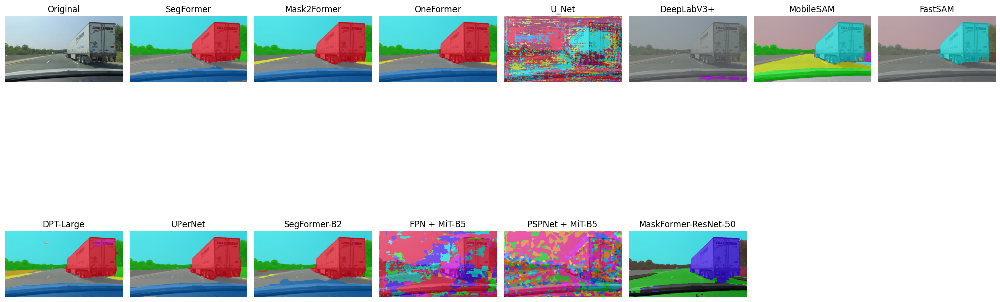

In [19]:
# Example usage 2:
img_url_2 = "https://www.shutterstock.com/shutterstock/videos/1106252821/thumb/1.jpg?ip=x480"

response_2 = requests.get(img_url_2)
original_img_2 = Image.open(BytesIO(response_2.content))
original_img_2.save("original_image_2.jpg")

# === SegFormer ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
local_model_path = "/home/yamshchikov/models/segformer-b5-ready"
processor = SegformerImageProcessor(do_resize=False)
model = SegformerForSemanticSegmentation.from_pretrained(local_model_path).to(device)

print(f"✅ Модель успешно загружена с локального пути!")
print(f"   Путь: {local_model_path}")
print(f"   Устройство: {device}")
print(model.config)

result_segf_2 = segment_image_unified(model, processor, original_img_2, "segformer", alpha=0.6)
result_segf_2.save("segmented_segformer_2.jpg")

# === Mask2Former ===
device = "cuda"
model_name = "facebook/mask2former-swin-base-ade-semantic"
processor = Mask2FormerImageProcessor.from_pretrained(model_name)
model = Mask2FormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_m2f_2 = segment_image_unified(model, processor, original_img_2, "mask2former", alpha=0.6)
result_m2f_2.save("segmented_mask2former_2.jpg")

# === OneFormer ===
model_name = "shi-labs/oneformer_ade20k_swin_large"
processor = OneFormerProcessor.from_pretrained(model_name)
model = OneFormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_of_2 = segment_image_unified(model, processor, original_img_2, "oneformer", alpha=0.6)
result_of_2.save("segmented_oneformer_2.jpg")

# === UNet ===
model_unet = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,  # под ваш датасет (ADE20K = 150)
    activation=None  # None для raw logits
).to(device).eval()
result_unet_2 = segment_image_unified(model_unet, None, original_img_2, "unet_smp", alpha=0.6)
result_unet_2.save("segmented_U_Net_2.jpg")


# === DeepLabV3+ (torchvision) ===
model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True).to(device).eval()
result_dl_2 = segment_image_unified(model, None, original_img_2, "deeplab_tv", alpha=0.6)
result_dl_2.save("segmented_deeplab_2.jpg")

# === MobileSAM ===
model = SAM("mobile_sam.pt")
result_sam_2 = segment_image_unified(model, None, original_img_2, "sam", alpha=0.6)
result_sam_2.save("segmented_sam_2.jpg")

# === SAM2 ===
model = SAM("sam2_t.pt")  # или "sam2_b.pt"
print(model)
result_fast_sam_2 = segment_image_unified(model, None, original_img_2, "sam2", alpha=0.6)
result_fast_sam_2.save("segmented_sam2_2.jpg")

from transformers import DPTImageProcessor, DPTForSemanticSegmentation

# === DPT-Large ===
model_name = "Intel/dpt-large-ade"  # ✅ safetensors, работает с PyTorch 2.6+
processor = DPTImageProcessor.from_pretrained(model_name)
model = DPTForSemanticSegmentation.from_pretrained(model_name).to(device)

result_dpt_2 = segment_image_unified(model, processor, original_img_2, "dpt", alpha=0.6)
result_dpt_2.save("segmented_dpt_2.jpg")

from transformers import AutoImageProcessor, AutoModelForSemanticSegmentation

# === UPerNet-ConvNeXt ===
model_name = "openmmlab/upernet-convnext-small"  # ✅ safetensors
processor = AutoImageProcessor.from_pretrained(model_name)
model = AutoModelForSemanticSegmentation.from_pretrained(model_name).to(device)

result_upernet_2 = segment_image_unified(model, processor, original_img_2, "upernet", alpha=0.6)
result_upernet_2.save("segmented_upernet_2.jpg")

from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation

# === SegFormer-B2 (быстрее B5) ===
model_name = "nvidia/segformer-b2-finetuned-ade-512-512"  # ✅ safetensors
processor = SegformerImageProcessor.from_pretrained(model_name)
model = SegformerForSemanticSegmentation.from_pretrained(model_name).to(device)

result_segf_b2_2 = segment_image_unified(model, processor, original_img_2, "segformer_b2", alpha=0.6)
result_segf_b2_2.save("segmented_segformer_b2_2.jpg")

from transformers import MaskFormerImageProcessor, MaskFormerForInstanceSegmentation

# === MaskFormer-ResNet-50 ===
model_name = "facebook/maskformer-resnet50-ade20k-full"
processor = MaskFormerImageProcessor.from_pretrained(model_name)
model = MaskFormerForInstanceSegmentation.from_pretrained(model_name).to(device)

result_mf_2 = segment_image_unified(model, processor, original_img_2, "maskformer", alpha=0.6)
result_mf_2.save("segmented_maskformer_2.jpg")

# HRNet через segmentation_models_pytorch
# === HRNet-W48 + U-Net (исправленная версия) ===
import segmentation_models_pytorch as smp

# === FPN + MiT-B5 ===
model_fpn_mit = smp.FPN(
    encoder_name="mit_b5",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,
    activation=None
).to(device).eval()

print(f"✅ FPN + MiT-B5 loaded (output_stride=32)")

# 🔧 Важно: используем model_type="fpn_mit" для правильного output_stride
result_fpn_mit_2 = segment_image_unified(model_fpn_mit, None, original_img_2, "fpn_mit", alpha=0.6)
result_fpn_mit_2.save("segmented_fpn_mit_b5_2.jpg")

# === PSPNet + MiT-B5 ===
model_psp_mit = smp.PSPNet(
    encoder_name="mit_b5",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,
    activation=None,
    psp_size=2048  # под mit_b5
).to(device).eval()

print(f"✅ PSPNet + MiT-B5 loaded (output_stride=8)")

# 🔧 Важно: model_type="psp_mit" для output_stride=8
result_psp_mit_2 = segment_image_unified(model_psp_mit, None, original_img_2, "psp_mit", alpha=0.6)
result_psp_mit_2.save("segmented_psp_mit_b5_2.jpg")

# === Визуализация сравнения ===
plt.figure(figsize=(20, 10))
titles = ["Original", "SegFormer","Mask2Former", "OneFormer", "U_Net", "DeepLabV3+", "MobileSAM", "FastSAM", "DPT-Large", "UPerNet", "SegFormer-B2","FPN + MiT-B5", "PSPNet + MiT-B5","MaskFormer-ResNet-50"]
images = [original_img_2, result_segf_2, result_m2f_2, result_of_2, result_unet_2, result_dl_2, result_sam_2, result_fast_sam_2, result_dpt_2, result_upernet_2, result_segf_b2_2, result_fpn_mit_2, result_psp_mit_2, result_mf_2]

for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(2, 8, i+1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

✅ Модель успешно загружена с локального пути!
   Путь: /home/yamshchikov/models/segformer-b5-ready
   Устройство: cuda
SegformerConfig {
  "architectures": [
    "SegformerForSemanticSegmentation"
  ],
  "attention_probs_dropout_prob": 0.0,
  "classifier_dropout_prob": 0.1,
  "decoder_hidden_size": 768,
  "depths": [
    3,
    6,
    40,
    3
  ],
  "downsampling_rates": [
    1,
    4,
    8,
    16
  ],
  "drop_path_rate": 0.1,
  "dtype": "float32",
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_sizes": [
    64,
    128,
    320,
    512
  ],
  "id2label": {
    "0": "wall",
    "1": "building",
    "2": "sky",
    "3": "floor",
    "4": "tree",
    "5": "ceiling",
    "6": "road",
    "7": "bed ",
    "8": "windowpane",
    "9": "grass",
    "10": "cabinet",
    "11": "sidewalk",
    "12": "person",
    "13": "earth",
    "14": "door",
    "15": "table",
    "16": "mountain",
    "17": "plant",
    "18": "curtain",
    "19": "chair",
    "20": "car",
    "21": "w

Some weights of DPTForSemanticSegmentation were not initialized from the model checkpoint at Intel/dpt-large-ade and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.batch_norm1.bias', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.num_batches_tracked', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.running_mean', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.running_var', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.weight', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.bias', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.num_batches_tracked', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.running_mean', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.running_var', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight']
You should probably TRAIN this mo

<class 'torch.Tensor'>
📈 DPT logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
📈 DPT logits: torch.Size([1, 150, 480, 480])
<class 'torch.Tensor'>
📈 Mask2Former logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [9 9 9 ... 9 9 9]
 [9 9 9 ... 9 9 9]
 [9 9 9 ... 9 9 9]]
<class 'torch.Tensor'>
📈 SegFormer logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [9 9 9 ... 9 9 9]
 [9 9 9 ... 9 9 9]
 [9 9 9 ... 9 9 9]]
<class 'torch.Tensor'>
📈 Mask2Former logits: {'type': 'None', 'note': 'logits not found'}
[[ 2  2  2 ...  2  2  2]
 [ 2  2  2 ...  2  2  2]
 [ 2  2  2 ...  2  2  2]
 ...
 [ 9  9 12 ...  9  9  9]
 [ 9  9  9 ...  9  9  9]
 [ 9  9  9 ...  9  9  9]]
✅ FPN + MiT-B5 loaded (output_stride=32)
📈 SMP logits: {'type': 'unknown', 'note': 'model_type=

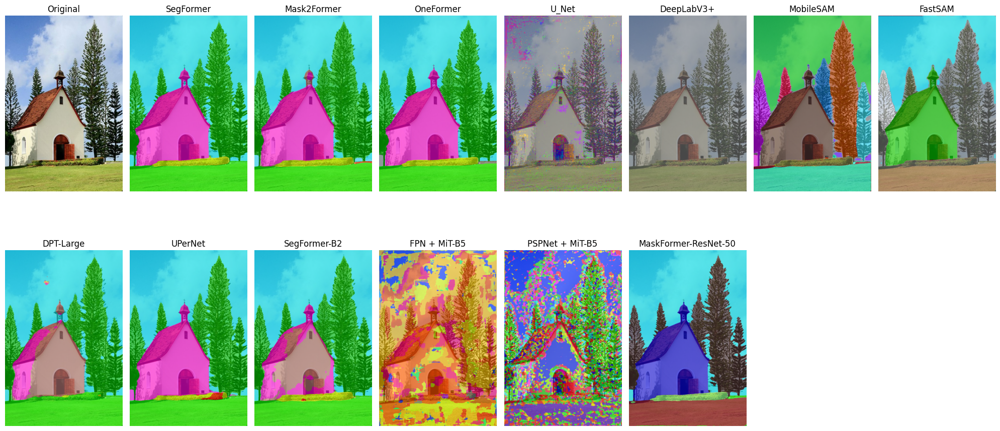

In [20]:
# Example usage 3:
img_url_3 = "https://i.pinimg.com/736x/86/f6/07/86f60748d5d9ae4cb9092018d1321648.jpg"

response_3 = requests.get(img_url_3)
original_img_3 = Image.open(BytesIO(response_3.content))
original_img_3.save("original_image_3.jpg")

# === SegFormer ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
local_model_path = "/home/yamshchikov/models/segformer-b5-ready"
processor = SegformerImageProcessor(do_resize=False)
model = SegformerForSemanticSegmentation.from_pretrained(local_model_path).to(device)

print(f"✅ Модель успешно загружена с локального пути!")
print(f"   Путь: {local_model_path}")
print(f"   Устройство: {device}")
print(model.config)

result_segf_3 = segment_image_unified(model, processor, original_img_3, "segformer", alpha=0.6)
result_segf_3.save("segmented_segformer_3.jpg")

# === Mask2Former ===
device = "cuda"
model_name = "facebook/mask2former-swin-base-ade-semantic"
processor = Mask2FormerImageProcessor.from_pretrained(model_name)
model = Mask2FormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_m2f_3 = segment_image_unified(model, processor, original_img_3, "mask2former", alpha=0.6)
result_m2f_3.save("segmented_mask2former_3.jpg")

# === OneFormer ===
model_name = "shi-labs/oneformer_ade20k_swin_large"
processor = OneFormerProcessor.from_pretrained(model_name)
model = OneFormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_of_3 = segment_image_unified(model, processor, original_img_3, "oneformer", alpha=0.6)
result_of_3.save("segmented_oneformer_3.jpg")

# === UNet ===
model_unet = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,  # под ваш датасет (ADE20K = 150)
    activation=None  # None для raw logits
).to(device).eval()
result_unet_3 = segment_image_unified(model_unet, None, original_img_3, "unet_smp", alpha=0.6)
result_unet_3.save("segmented_U_Net_3.jpg")


# === DeepLabV3+ (torchvision) ===
model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True).to(device).eval()
result_dl_3 = segment_image_unified(model, None, original_img_3, "deeplab_tv", alpha=0.6)
result_dl_3.save("segmented_deeplab_3.jpg")

# === MobileSAM ===
model = SAM("mobile_sam.pt")
result_sam_3 = segment_image_unified(model, None, original_img_3, "sam", alpha=0.6)
result_sam_3.save("segmented_sam_3.jpg")

# === SAM2 ===
model = SAM("sam2_t.pt")  # или "sam2_b.pt"
print(model)
result_fast_sam_3 = segment_image_unified(model, None, original_img_3, "sam2", alpha=0.6)
result_fast_sam_3.save("segmented_sam2_3.jpg")

from transformers import DPTImageProcessor, DPTForSemanticSegmentation

# === DPT-Large ===
model_name = "Intel/dpt-large-ade"  # ✅ safetensors, работает с PyTorch 2.6+
processor = DPTImageProcessor.from_pretrained(model_name)
model = DPTForSemanticSegmentation.from_pretrained(model_name).to(device)

result_dpt_3 = segment_image_unified(model, processor, original_img_3, "dpt", alpha=0.6)
result_dpt_3.save("segmented_dpt_3.jpg")

from transformers import AutoImageProcessor, AutoModelForSemanticSegmentation

# === UPerNet-ConvNeXt ===
model_name = "openmmlab/upernet-convnext-small"  # ✅ safetensors
processor = AutoImageProcessor.from_pretrained(model_name)
model = AutoModelForSemanticSegmentation.from_pretrained(model_name).to(device)

result_upernet_3 = segment_image_unified(model, processor, original_img_3, "upernet", alpha=0.6)
result_upernet_3.save("segmented_upernet_3.jpg")

from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation

# === SegFormer-B2 (быстрее B5) ===
model_name = "nvidia/segformer-b2-finetuned-ade-512-512"  # ✅ safetensors
processor = SegformerImageProcessor.from_pretrained(model_name)
model = SegformerForSemanticSegmentation.from_pretrained(model_name).to(device)

result_segf_b2_3 = segment_image_unified(model, processor, original_img_3, "segformer_b2", alpha=0.6)
result_segf_b2_3.save("segmented_segformer_b2_3.jpg")

from transformers import MaskFormerImageProcessor, MaskFormerForInstanceSegmentation

# === MaskFormer-ResNet-50 ===
model_name = "facebook/maskformer-resnet50-ade20k-full"
processor = MaskFormerImageProcessor.from_pretrained(model_name)
model = MaskFormerForInstanceSegmentation.from_pretrained(model_name).to(device)

result_mf_3 = segment_image_unified(model, processor, original_img_3, "maskformer", alpha=0.6)
result_mf_3.save("segmented_maskformer_3.jpg")

# HRNet через segmentation_models_pytorch
# === HRNet-W48 + U-Net (исправленная версия) ===
import segmentation_models_pytorch as smp

# === FPN + MiT-B5 ===
model_fpn_mit = smp.FPN(
    encoder_name="mit_b5",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,
    activation=None
).to(device).eval()

print(f"✅ FPN + MiT-B5 loaded (output_stride=32)")

# 🔧 Важно: используем model_type="fpn_mit" для правильного output_stride
result_fpn_mit_3 = segment_image_unified(model_fpn_mit, None, original_img_3, "fpn_mit", alpha=0.6)
result_fpn_mit_3.save("segmented_fpn_mit_b5_3.jpg")

# === PSPNet + MiT-B5 ===
model_psp_mit = smp.PSPNet(
    encoder_name="mit_b5",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,
    activation=None,
    psp_size=2048  # под mit_b5
).to(device).eval()

print(f"✅ PSPNet + MiT-B5 loaded (output_stride=8)")

# 🔧 Важно: model_type="psp_mit" для output_stride=8
result_psp_mit_3 = segment_image_unified(model_psp_mit, None, original_img_3, "psp_mit", alpha=0.6)
result_psp_mit_3.save("segmented_psp_mit_b5_3.jpg")

# === Визуализация сравнения ===
plt.figure(figsize=(20, 10))
titles = ["Original", "SegFormer","Mask2Former", "OneFormer", "U_Net", "DeepLabV3+", "MobileSAM", "FastSAM", "DPT-Large", "UPerNet", "SegFormer-B2","FPN + MiT-B5", "PSPNet + MiT-B5","MaskFormer-ResNet-50"]
images = [original_img_3, result_segf_3, result_m2f_3, result_of_3, result_unet_3, result_dl_3, result_sam_3, result_fast_sam_3, result_dpt_3, result_upernet_3, result_segf_b2_3, result_fpn_mit_3, result_psp_mit_3, result_mf_3]

for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(2, 8, i+1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

✅ Модель успешно загружена с локального пути!
   Путь: /home/yamshchikov/models/segformer-b5-ready
   Устройство: cuda
SegformerConfig {
  "architectures": [
    "SegformerForSemanticSegmentation"
  ],
  "attention_probs_dropout_prob": 0.0,
  "classifier_dropout_prob": 0.1,
  "decoder_hidden_size": 768,
  "depths": [
    3,
    6,
    40,
    3
  ],
  "downsampling_rates": [
    1,
    4,
    8,
    16
  ],
  "drop_path_rate": 0.1,
  "dtype": "float32",
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_sizes": [
    64,
    128,
    320,
    512
  ],
  "id2label": {
    "0": "wall",
    "1": "building",
    "2": "sky",
    "3": "floor",
    "4": "tree",
    "5": "ceiling",
    "6": "road",
    "7": "bed ",
    "8": "windowpane",
    "9": "grass",
    "10": "cabinet",
    "11": "sidewalk",
    "12": "person",
    "13": "earth",
    "14": "door",
    "15": "table",
    "16": "mountain",
    "17": "plant",
    "18": "curtain",
    "19": "chair",
    "20": "car",
    "21": "w

Some weights of DPTForSemanticSegmentation were not initialized from the model checkpoint at Intel/dpt-large-ade and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.batch_norm1.bias', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.num_batches_tracked', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.running_mean', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.running_var', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.weight', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.bias', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.num_batches_tracked', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.running_mean', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.running_var', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight']
You should probably TRAIN this mo

<class 'torch.Tensor'>
📈 DPT logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
📈 DPT logits: torch.Size([1, 150, 480, 480])
<class 'torch.Tensor'>
📈 Mask2Former logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [6 6 6 ... 6 6 6]
 [6 6 6 ... 6 6 6]
 [6 6 6 ... 6 6 6]]
<class 'torch.Tensor'>
📈 SegFormer logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [6 6 6 ... 6 6 6]
 [6 6 6 ... 6 6 6]
 [6 6 6 ... 6 6 6]]
<class 'torch.Tensor'>
📈 Mask2Former logits: {'type': 'None', 'note': 'logits not found'}
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]]
✅ FPN + MiT-B5 loaded (output_stride=32)
📈 SMP logits: {'type': 'unknown', 'note': 'model_type=smp'}
✅ PSPNet + MiT-B5 loaded (outp

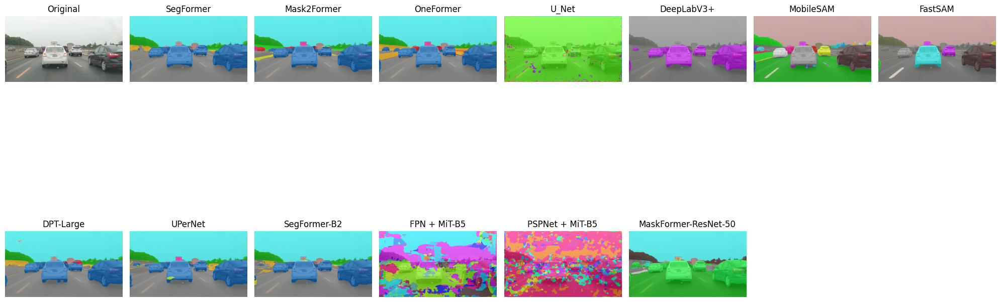

In [21]:
# Example usage 4:
img_url_4 = "https://images.pond5.com/pov-car-and-truck-traffic-footage-190002081_iconl.jpeg"

response_4 = requests.get(img_url_4)
original_img_4 = Image.open(BytesIO(response_4.content))
original_img_4.save("original_image_4.jpg")

# === SegFormer ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
local_model_path = "/home/yamshchikov/models/segformer-b5-ready"
processor = SegformerImageProcessor(do_resize=False)
model = SegformerForSemanticSegmentation.from_pretrained(local_model_path).to(device)

print(f"✅ Модель успешно загружена с локального пути!")
print(f"   Путь: {local_model_path}")
print(f"   Устройство: {device}")
print(model.config)

result_segf_4 = segment_image_unified(model, processor, original_img_4, "segformer", alpha=0.6)
result_segf_4.save("segmented_segformer_4.jpg")

# === Mask2Former ===
device = "cuda"
model_name = "facebook/mask2former-swin-base-ade-semantic"
processor = Mask2FormerImageProcessor.from_pretrained(model_name)
model = Mask2FormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_m2f_4 = segment_image_unified(model, processor, original_img_4, "mask2former", alpha=0.6)
result_m2f_4.save("segmented_mask2former_4.jpg")

# === OneFormer ===
model_name = "shi-labs/oneformer_ade20k_swin_large"
processor = OneFormerProcessor.from_pretrained(model_name)
model = OneFormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_of_4 = segment_image_unified(model, processor, original_img_4, "oneformer", alpha=0.6)
result_of_4.save("segmented_oneformer_4.jpg")

# === UNet ===
model_unet = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,  # под ваш датасет (ADE20K = 150)
    activation=None  # None для raw logits
).to(device).eval()
result_unet_4 = segment_image_unified(model_unet, None, original_img_4, "unet_smp", alpha=0.6)
result_unet_4.save("segmented_U_Net_4.jpg")

# === DeepLabV3+ (torchvision) ===
model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True).to(device).eval()
result_dl_4 = segment_image_unified(model, None, original_img_4, "deeplab_tv", alpha=0.6)
result_dl_4.save("segmented_deeplab_4.jpg")

# === MobileSAM ===
model = SAM("mobile_sam.pt")
result_sam_4 = segment_image_unified(model, None, original_img_4, "sam", alpha=0.6)
result_sam_4.save("segmented_sam_4.jpg")

# === SAM2 ===
model = SAM("sam2_t.pt")  # или "sam2_b.pt"
print(model)
result_fast_sam_4 = segment_image_unified(model, None, original_img_4, "sam2", alpha=0.6)
result_fast_sam_4.save("segmented_sam2_4.jpg")

from transformers import DPTImageProcessor, DPTForSemanticSegmentation

# === DPT-Large ===
model_name = "Intel/dpt-large-ade"  # ✅ safetensors, работает с PyTorch 2.6+
processor = DPTImageProcessor.from_pretrained(model_name)
model = DPTForSemanticSegmentation.from_pretrained(model_name).to(device)

result_dpt_4 = segment_image_unified(model, processor, original_img_4, "dpt", alpha=0.6)
result_dpt_4.save("segmented_dpt_4.jpg")

from transformers import AutoImageProcessor, AutoModelForSemanticSegmentation

# === UPerNet-ConvNeXt ===
model_name = "openmmlab/upernet-convnext-small"  # ✅ safetensors
processor = AutoImageProcessor.from_pretrained(model_name)
model = AutoModelForSemanticSegmentation.from_pretrained(model_name).to(device)

result_upernet_4 = segment_image_unified(model, processor, original_img_4, "upernet", alpha=0.6)
result_upernet_4.save("segmented_upernet_4.jpg")

from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation

# === SegFormer-B2 (быстрее B5) ===
model_name = "nvidia/segformer-b2-finetuned-ade-512-512"  # ✅ safetensors
processor = SegformerImageProcessor.from_pretrained(model_name)
model = SegformerForSemanticSegmentation.from_pretrained(model_name).to(device)

result_segf_b2_4 = segment_image_unified(model, processor, original_img_4, "segformer_b2", alpha=0.6)
result_segf_b2_4.save("segmented_segformer_b2_4.jpg")

from transformers import MaskFormerImageProcessor, MaskFormerForInstanceSegmentation

# === MaskFormer-ResNet-50 ===
model_name = "facebook/maskformer-resnet50-ade20k-full"
processor = MaskFormerImageProcessor.from_pretrained(model_name)
model = MaskFormerForInstanceSegmentation.from_pretrained(model_name).to(device)

result_mf_4 = segment_image_unified(model, processor, original_img_4, "maskformer", alpha=0.6)
result_mf_4.save("segmented_maskformer_4.jpg")

# HRNet через segmentation_models_pytorch
# === HRNet-W48 + U-Net (исправленная версия) ===
import segmentation_models_pytorch as smp

# === FPN + MiT-B5 ===
model_fpn_mit = smp.FPN(
    encoder_name="mit_b5",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,
    activation=None
).to(device).eval()

print(f"✅ FPN + MiT-B5 loaded (output_stride=32)")

# 🔧 Важно: используем model_type="fpn_mit" для правильного output_stride
result_fpn_mit_4 = segment_image_unified(model_fpn_mit, None, original_img_4, "fpn_mit", alpha=0.6)
result_fpn_mit_4.save("segmented_fpn_mit_b5_4.jpg")

# === PSPNet + MiT-B5 ===
model_psp_mit = smp.PSPNet(
    encoder_name="mit_b5",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,
    activation=None,
    psp_size=2048  # под mit_b5
).to(device).eval()

print(f"✅ PSPNet + MiT-B5 loaded (output_stride=8)")

# 🔧 Важно: model_type="psp_mit" для output_stride=8
result_psp_mit_4 = segment_image_unified(model_psp_mit, None, original_img_4, "psp_mit", alpha=0.6)
result_psp_mit_4.save("segmented_psp_mit_b5_4.jpg")

# === Визуализация сравнения ===
plt.figure(figsize=(20, 10))
titles = ["Original", "SegFormer","Mask2Former", "OneFormer", "U_Net", "DeepLabV3+", "MobileSAM", "FastSAM", "DPT-Large", "UPerNet", "SegFormer-B2","FPN + MiT-B5", "PSPNet + MiT-B5","MaskFormer-ResNet-50"]
images = [original_img_4, result_segf_4, result_m2f_4, result_of_4, result_unet_4, result_dl_4, result_sam_4, result_fast_sam_4, result_dpt_4, result_upernet_4, result_segf_b2_4, result_fpn_mit_4, result_psp_mit_4, result_mf_4]

for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(2, 8, i+1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

✅ Модель успешно загружена с локального пути!
   Путь: /home/yamshchikov/models/segformer-b5-ready
   Устройство: cuda
SegformerConfig {
  "architectures": [
    "SegformerForSemanticSegmentation"
  ],
  "attention_probs_dropout_prob": 0.0,
  "classifier_dropout_prob": 0.1,
  "decoder_hidden_size": 768,
  "depths": [
    3,
    6,
    40,
    3
  ],
  "downsampling_rates": [
    1,
    4,
    8,
    16
  ],
  "drop_path_rate": 0.1,
  "dtype": "float32",
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_sizes": [
    64,
    128,
    320,
    512
  ],
  "id2label": {
    "0": "wall",
    "1": "building",
    "2": "sky",
    "3": "floor",
    "4": "tree",
    "5": "ceiling",
    "6": "road",
    "7": "bed ",
    "8": "windowpane",
    "9": "grass",
    "10": "cabinet",
    "11": "sidewalk",
    "12": "person",
    "13": "earth",
    "14": "door",
    "15": "table",
    "16": "mountain",
    "17": "plant",
    "18": "curtain",
    "19": "chair",
    "20": "car",
    "21": "w

Some weights of DPTForSemanticSegmentation were not initialized from the model checkpoint at Intel/dpt-large-ade and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.batch_norm1.bias', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.num_batches_tracked', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.running_mean', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.running_var', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.weight', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.bias', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.num_batches_tracked', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.running_mean', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.running_var', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight']
You should probably TRAIN this mo

<class 'torch.Tensor'>
📈 DPT logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
📈 DPT logits: torch.Size([1, 150, 480, 480])
<class 'torch.Tensor'>
📈 Mask2Former logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [6 6 6 ... 6 6 6]
 [6 6 6 ... 6 6 6]
 [6 6 6 ... 6 6 6]]
<class 'torch.Tensor'>
📈 SegFormer logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [6 6 6 ... 6 6 6]
 [6 6 6 ... 6 6 6]
 [6 6 6 ... 6 6 6]]
<class 'torch.Tensor'>
📈 Mask2Former logits: {'type': 'None', 'note': 'logits not found'}
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]]
✅ FPN + MiT-B5 loaded (output_stride=32)
📈 SMP logits: {'type': 'unknown', 'note': 'model_type=smp'}
✅ PSPNet + MiT-B5 loaded (outp

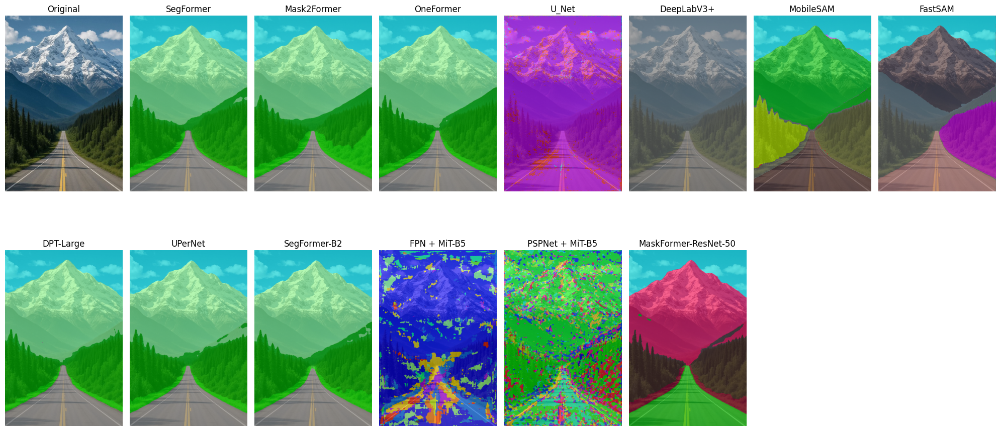

In [22]:
# Example usage 5:
img_url_5 = "https://i.pinimg.com/736x/17/66/c4/1766c4f667af39f91172ef8eb21ab18a.jpg"

response_5 = requests.get(img_url_5)
original_img_5 = Image.open(BytesIO(response_5.content))
original_img_5.save("original_image_5.jpg")

# === SegFormer ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
local_model_path = "/home/yamshchikov/models/segformer-b5-ready"
processor = SegformerImageProcessor(do_resize=False)
model = SegformerForSemanticSegmentation.from_pretrained(local_model_path).to(device)

print(f"✅ Модель успешно загружена с локального пути!")
print(f"   Путь: {local_model_path}")
print(f"   Устройство: {device}")
print(model.config)

result_segf_5 = segment_image_unified(model, processor, original_img_5, "segformer", alpha=0.6)
result_segf_5.save("segmented_segformer_5.jpg")

# === Mask2Former ===
device = "cuda"
model_name = "facebook/mask2former-swin-base-ade-semantic"
processor = Mask2FormerImageProcessor.from_pretrained(model_name)
model = Mask2FormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_m2f_5 = segment_image_unified(model, processor, original_img_5, "mask2former", alpha=0.6)
result_m2f_5.save("segmented_mask2former_5.jpg")

# === OneFormer ===
model_name = "shi-labs/oneformer_ade20k_swin_large"
processor = OneFormerProcessor.from_pretrained(model_name)
model = OneFormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_of_5 = segment_image_unified(model, processor, original_img_5, "oneformer", alpha=0.6)
result_of_5.save("segmented_oneformer_5.jpg")

# === UNet ===
model_unet = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,  # под ваш датасет (ADE20K = 150)
    activation=None  # None для raw logits
).to(device).eval()
result_unet_5 = segment_image_unified(model_unet, None, original_img_5, "unet_smp", alpha=0.6)
result_unet_5.save("segmented_U_Net_5.jpg")

# === DeepLabV3+ (torchvision) ===
model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True).to(device).eval()
result_dl_5 = segment_image_unified(model, None, original_img_5, "deeplab_tv", alpha=0.6)
result_dl_5.save("segmented_deeplab_5.jpg")

# === MobileSAM ===
model = SAM("mobile_sam.pt")
result_sam_5 = segment_image_unified(model, None, original_img_5, "sam", alpha=0.6)
result_sam_5.save("segmented_sam_5.jpg")

# === SAM2 ===
model = SAM("sam2_t.pt")  # или "sam2_b.pt"
print(model)
result_fast_sam_5 = segment_image_unified(model, None, original_img_5, "sam2", alpha=0.6)
result_fast_sam_5.save("segmented_sam2_5.jpg")

from transformers import DPTImageProcessor, DPTForSemanticSegmentation

# === DPT-Large ===
model_name = "Intel/dpt-large-ade"  # ✅ safetensors, работает с PyTorch 2.6+
processor = DPTImageProcessor.from_pretrained(model_name)
model = DPTForSemanticSegmentation.from_pretrained(model_name).to(device)

result_dpt_5 = segment_image_unified(model, processor, original_img_5, "dpt", alpha=0.6)
result_dpt_5.save("segmented_dpt_5.jpg")

from transformers import AutoImageProcessor, AutoModelForSemanticSegmentation

# === UPerNet-ConvNeXt ===
model_name = "openmmlab/upernet-convnext-small"  # ✅ safetensors
processor = AutoImageProcessor.from_pretrained(model_name)
model = AutoModelForSemanticSegmentation.from_pretrained(model_name).to(device)

result_upernet_5 = segment_image_unified(model, processor, original_img_5, "upernet", alpha=0.6)
result_upernet_5.save("segmented_upernet_5.jpg")

from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation

# === SegFormer-B2 (быстрее B5) ===
model_name = "nvidia/segformer-b2-finetuned-ade-512-512"  # ✅ safetensors
processor = SegformerImageProcessor.from_pretrained(model_name)
model = SegformerForSemanticSegmentation.from_pretrained(model_name).to(device)

result_segf_b2_5 = segment_image_unified(model, processor, original_img_5, "segformer_b2", alpha=0.6)
result_segf_b2_5.save("segmented_segformer_b2_5.jpg")

from transformers import MaskFormerImageProcessor, MaskFormerForInstanceSegmentation

# === MaskFormer-ResNet-50 ===
model_name = "facebook/maskformer-resnet50-ade20k-full"
processor = MaskFormerImageProcessor.from_pretrained(model_name)
model = MaskFormerForInstanceSegmentation.from_pretrained(model_name).to(device)

result_mf_5 = segment_image_unified(model, processor, original_img_5, "maskformer", alpha=0.6)
result_mf_5.save("segmented_maskformer_5.jpg")

# HRNet через segmentation_models_pytorch
# === HRNet-W48 + U-Net (исправленная версия) ===
import segmentation_models_pytorch as smp

# === FPN + MiT-B5 ===
model_fpn_mit = smp.FPN(
    encoder_name="mit_b5",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,
    activation=None
).to(device).eval()

print(f"✅ FPN + MiT-B5 loaded (output_stride=32)")

# 🔧 Важно: используем model_type="fpn_mit" для правильного output_stride
result_fpn_mit_5 = segment_image_unified(model_fpn_mit, None, original_img_5, "fpn_mit", alpha=0.6)
result_fpn_mit_5.save("segmented_fpn_mit_b5_5.jpg")

# === PSPNet + MiT-B5 ===
model_psp_mit = smp.PSPNet(
    encoder_name="mit_b5",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,
    activation=None,
    psp_size=2048  # под mit_b5
).to(device).eval()

print(f"✅ PSPNet + MiT-B5 loaded (output_stride=8)")

# 🔧 Важно: model_type="psp_mit" для output_stride=8
result_psp_mit_5 = segment_image_unified(model_psp_mit, None, original_img_5, "psp_mit", alpha=0.6)
result_psp_mit_5.save("segmented_psp_mit_b5_5.jpg")

# === Визуализация сравнения ===
plt.figure(figsize=(20, 10))
titles = ["Original", "SegFormer","Mask2Former", "OneFormer", "U_Net", "DeepLabV3+", "MobileSAM", "FastSAM", "DPT-Large", "UPerNet", "SegFormer-B2","FPN + MiT-B5", "PSPNet + MiT-B5","MaskFormer-ResNet-50"]
images = [original_img_5, result_segf_5, result_m2f_5, result_of_5, result_unet_5, result_dl_5, result_sam_5, result_fast_sam_5, result_dpt_5, result_upernet_5, result_segf_b2_5, result_fpn_mit_5, result_psp_mit_5, result_mf_5]

for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(2, 8, i+1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

✅ Модель успешно загружена с локального пути!
   Путь: /home/yamshchikov/models/segformer-b5-ready
   Устройство: cuda
SegformerConfig {
  "architectures": [
    "SegformerForSemanticSegmentation"
  ],
  "attention_probs_dropout_prob": 0.0,
  "classifier_dropout_prob": 0.1,
  "decoder_hidden_size": 768,
  "depths": [
    3,
    6,
    40,
    3
  ],
  "downsampling_rates": [
    1,
    4,
    8,
    16
  ],
  "drop_path_rate": 0.1,
  "dtype": "float32",
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_sizes": [
    64,
    128,
    320,
    512
  ],
  "id2label": {
    "0": "wall",
    "1": "building",
    "2": "sky",
    "3": "floor",
    "4": "tree",
    "5": "ceiling",
    "6": "road",
    "7": "bed ",
    "8": "windowpane",
    "9": "grass",
    "10": "cabinet",
    "11": "sidewalk",
    "12": "person",
    "13": "earth",
    "14": "door",
    "15": "table",
    "16": "mountain",
    "17": "plant",
    "18": "curtain",
    "19": "chair",
    "20": "car",
    "21": "w

/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


📈 DeepLabV3+ logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]

0: 1024x1024 1 0, 1 1, 1 2, 1 3, 1 4, 1 5, 1 6, 1 7, 1 8, 1 9, 1 10, 1 11, 1 12, 1 13, 1 14, 1 15, 1 16, 1 17, 1 18, 1 19, 1 20, 1 21, 1 22, 1 23, 1 24, 1 25, 1 26, 1 27, 1 28, 1 29, 1 30, 1 31, 1 32, 3249.3ms
Speed: 2.9ms preprocess, 3249.3ms inference, 2.2ms postprocess per image at shape (1, 3, 1024, 1024)
📈 MobileSAM: instance segmentation (no class logits)
   Masks: torch.Size([33, 960, 640]), conf: tensor([1.0475, 1.0163, 1.0151, 1.0141, 1.0087, 1.0031, 1.0006, 0.9981, 0.9969, 0.9913, 0.9873, 0.9717, 0.9633, 0.9476, 0.9433, 0.9428, 0.9401, 0.9385, 0.9369, 0.9333, 0.9303, 0.9254, 0.9181, 0.9169, 0.9150, 0.9131, 0.9120, 0.9054, 0.8942, 0.8930, 0.8920, 0.8907, 0.8906], device='cuda:0')
[[6 6 6 ... 4 0 0]
 [6 6 6 ... 4 4 0]
 [6 6 6 ... 4 4 0]
 ...
 [5 5 5 ... 3 3

Some weights of DPTForSemanticSegmentation were not initialized from the model checkpoint at Intel/dpt-large-ade and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.batch_norm1.bias', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.num_batches_tracked', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.running_mean', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.running_var', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.weight', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.bias', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.num_batches_tracked', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.running_mean', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.running_var', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight']
You should probably TRAIN this mo

<class 'torch.Tensor'>
📈 DPT logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
📈 DPT logits: torch.Size([1, 150, 480, 480])
<class 'torch.Tensor'>
📈 Mask2Former logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[2 2 2 ... 4 4 4]
 [2 2 2 ... 4 4 4]
 [2 2 2 ... 4 4 4]
 ...
 [9 9 9 ... 9 9 9]
 [9 9 9 ... 9 9 9]
 [9 9 9 ... 9 9 9]]
<class 'torch.Tensor'>
📈 SegFormer logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[2 2 2 ... 4 4 4]
 [2 2 2 ... 4 4 4]
 [2 2 2 ... 4 4 4]
 ...
 [9 9 9 ... 9 9 9]
 [9 9 9 ... 9 9 9]
 [9 9 9 ... 9 9 9]]


/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `MaskFormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)


<class 'torch.Tensor'>
📈 Mask2Former logits: {'type': 'None', 'note': 'logits not found'}
[[ 2  2  2 ...  3  3  3]
 [ 2  2  2 ...  3  3  3]
 [ 2  2  2 ...  3  3  3]
 ...
 [12 12 12 ... 12 12 12]
 [12 12 12 ... 12 12 12]
 [12 12 12 ... 12 12 12]]
✅ FPN + MiT-B5 loaded (output_stride=32)
📈 SMP logits: {'type': 'unknown', 'note': 'model_type=smp'}
✅ PSPNet + MiT-B5 loaded (output_stride=8)
📈 SMP logits: {'type': 'unknown', 'note': 'model_type=smp'}


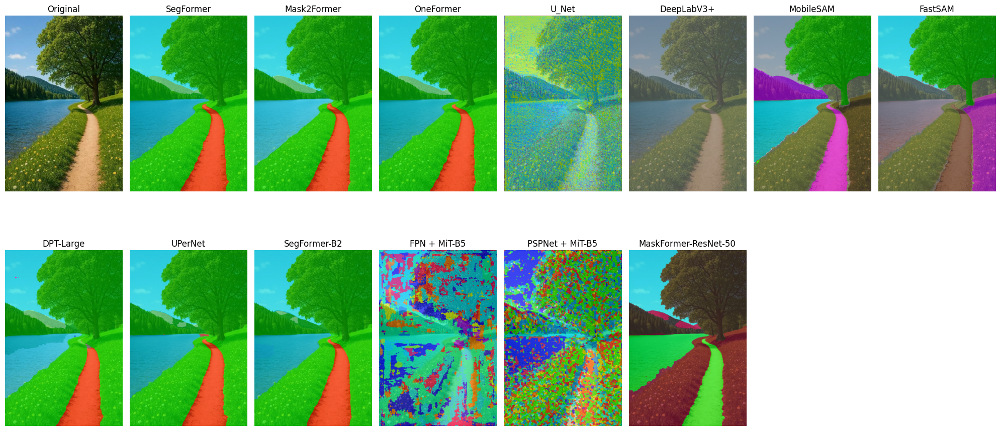

In [51]:
# Example usage 6:
img_url_6 = "https://i.pinimg.com/736x/f7/5a/f2/f75af26820b50c24600f50f3998eb02f.jpg"

response_6 = requests.get(img_url_6)
original_img_6 = Image.open(BytesIO(response_6.content))
original_img_6.save("original_image_6.jpg")

# === SegFormer ===

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
local_model_path = "/home/yamshchikov/models/segformer-b5-ready"
processor = SegformerImageProcessor(do_resize=False)
model = SegformerForSemanticSegmentation.from_pretrained(local_model_path).to(device)

print(f"✅ Модель успешно загружена с локального пути!")
print(f"   Путь: {local_model_path}")
print(f"   Устройство: {device}")
print(model.config)

result_segf_6 = segment_image_unified(model, processor, original_img_6, "segformer", alpha=0.6)
result_segf_6.save("segmented_segformer_6.jpg")

# === Mask2Former ===
device = "cuda"
model_name = "facebook/mask2former-swin-base-ade-semantic"
processor = Mask2FormerImageProcessor.from_pretrained(model_name)
model = Mask2FormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_m2f_6 = segment_image_unified(model, processor, original_img_6, "mask2former", alpha=0.6)
result_m2f_6.save("segmented_mask2former_6.jpg")

# === OneFormer ===
model_name = "shi-labs/oneformer_ade20k_swin_large"
processor = OneFormerProcessor.from_pretrained(model_name)
model = OneFormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_of_6 = segment_image_unified(model, processor, original_img_6, "oneformer", alpha=0.6)
result_of_5.save("segmented_oneformer_6.jpg")

# === UNet ===
model_unet = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,  # под ваш датасет (ADE20K = 150)
    activation=None  # None для raw logits
).to(device).eval()
result_unet_6 = segment_image_unified(model_unet, None, original_img_6, "unet_smp", alpha=0.6)
result_unet_6.save("segmented_U_Net_6.jpg")

# === DeepLabV3+ (torchvision) ===
model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True).to(device).eval()
result_dl_6 = segment_image_unified(model, None, original_img_6, "deeplab_tv", alpha=0.6)
result_dl_6.save("segmented_deeplab_6.jpg")

# === MobileSAM ===
model = SAM("mobile_sam.pt")
result_sam_6 = segment_image_unified(model, None, original_img_6, "sam", alpha=0.6)
result_sam_6.save("segmented_sam_6.jpg")

# === SAM2 ===
model = SAM("sam2_t.pt")  # или "sam2_b.pt"
print(model)
result_fast_sam_6 = segment_image_unified(model, None, original_img_6, "sam2", alpha=0.6)
result_fast_sam_6.save("segmented_sam2_6.jpg")

from transformers import DPTImageProcessor, DPTForSemanticSegmentation

# === DPT-Large ===
model_name = "Intel/dpt-large-ade"  # ✅ safetensors, работает с PyTorch 2.6+
processor = DPTImageProcessor.from_pretrained(model_name)
model = DPTForSemanticSegmentation.from_pretrained(model_name).to(device)

result_dpt_6 = segment_image_unified(model, processor, original_img_6, "dpt", alpha=0.6)
result_dpt_6.save("segmented_dpt_6.jpg")

from transformers import AutoImageProcessor, AutoModelForSemanticSegmentation

# === UPerNet-ConvNeXt ===
model_name = "openmmlab/upernet-convnext-small"  # ✅ safetensors
processor = AutoImageProcessor.from_pretrained(model_name)
model = AutoModelForSemanticSegmentation.from_pretrained(model_name).to(device)

result_upernet_6 = segment_image_unified(model, processor, original_img_6, "upernet", alpha=0.6)
result_upernet_6.save("segmented_upernet_6.jpg")

from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation

# === SegFormer-B2 (быстрее B5) ===
model_name = "nvidia/segformer-b2-finetuned-ade-512-512"  # ✅ safetensors
processor = SegformerImageProcessor.from_pretrained(model_name)
model = SegformerForSemanticSegmentation.from_pretrained(model_name).to(device)

result_segf_b2_6 = segment_image_unified(model, processor, original_img_6, "segformer_b2", alpha=0.6)
result_segf_b2_6.save("segmented_segformer_b2_6.jpg")

from transformers import MaskFormerImageProcessor, MaskFormerForInstanceSegmentation

# === MaskFormer-ResNet-50 ===
model_name = "facebook/maskformer-resnet50-ade20k-full"
processor = MaskFormerImageProcessor.from_pretrained(model_name)
model = MaskFormerForInstanceSegmentation.from_pretrained(model_name).to(device)

result_mf_6 = segment_image_unified(model, processor, original_img_6, "maskformer", alpha=0.6)
result_mf_6.save("segmented_maskformer_6.jpg")

# HRNet через segmentation_models_pytorch
# === HRNet-W48 + U-Net (исправленная версия) ===
import segmentation_models_pytorch as smp

# === FPN + MiT-B5 ===
model_fpn_mit = smp.FPN(
    encoder_name="mit_b5",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,
    activation=None
).to(device).eval()

print(f"✅ FPN + MiT-B5 loaded (output_stride=32)")

# 🔧 Важно: используем model_type="fpn_mit" для правильного output_stride
result_fpn_mit_6 = segment_image_unified(model_fpn_mit, None, original_img_6, "fpn_mit", alpha=0.6)
result_fpn_mit_6.save("segmented_fpn_mit_b5_6.jpg")

# === PSPNet + MiT-B5 ===
model_psp_mit = smp.PSPNet(
    encoder_name="mit_b5",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,
    activation=None,
    psp_size=2048  # под mit_b5
).to(device).eval()

print(f"✅ PSPNet + MiT-B5 loaded (output_stride=8)")

# 🔧 Важно: model_type="psp_mit" для output_stride=8
result_psp_mit_6 = segment_image_unified(model_psp_mit, None, original_img_6, "psp_mit", alpha=0.6)
result_psp_mit_6.save("segmented_psp_mit_b5_6.jpg")

# === Визуализация сравнения ===
plt.figure(figsize=(20, 10))
titles = ["Original", "SegFormer","Mask2Former", "OneFormer", "U_Net", "DeepLabV3+", "MobileSAM", "FastSAM", "DPT-Large", "UPerNet", "SegFormer-B2","FPN + MiT-B5", "PSPNet + MiT-B5","MaskFormer-ResNet-50"]
images = [original_img_6, result_segf_6, result_m2f_6, result_of_6, result_unet_6, result_dl_6, result_sam_6, result_fast_sam_6, result_dpt_6, result_upernet_6, result_segf_b2_6, result_fpn_mit_6, result_psp_mit_6, result_mf_6]

for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(2, 8, i+1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [52]:
class SegmentationBenchmark:
    """Полноценный бенчмарк для сравнения архитектур сегментации"""
    
    def __init__(self, device="cuda", num_classes=150, ignore_index=255, class_names: list = None):
        self.device = device
        self.num_classes = num_classes
        self.ignore_index = ignore_index
        self.models = {}
        self.palette = ade_palette()
        self.results = {}  # {model_name: {metrics, time, overlay, ...}}
        self.class_names = class_names or [f"Class {i}" for i in range(num_classes)]

    def load_model(self, key: str, model, processor=None, model_type: str = "segformer"):
        """Регистрация модели для бенчмарка"""
        self.models[key] = {"model": model, "processor": processor, "type": model_type}
        return self
    
    def load_segformer(self, path: str):
        from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation
        processor = SegformerImageProcessor.from_pretrained(path)
        model = SegformerForSemanticSegmentation.from_pretrained(path).to(self.device).eval()
        return self.load_model("segformer", model, processor, "segformer")

    def load_segformer_variant(self, variant="b2"):
        """Загрузка разных версий SegFormer для сравнения"""
        from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation
        variants = {
            "b0": "nvidia/segformer-b0-finetuned-ade-512-512",
            "b1": "nvidia/segformer-b1-finetuned-ade-512-512",
            "b2": "nvidia/segformer-b2-finetuned-ade-512-512",
            "b3": "nvidia/segformer-b3-finetuned-ade-640-640",
            "b4": "nvidia/segformer-b4-finetuned-ade-640-640",
            "b5": self.models.get("segformer", None)  # Уже загружен
        }
        if variant == "b5":
            return self  # Пропускаем, уже загружен
        if variant not in variants:
            raise ValueError(f"Unknown SegFormer variant: {variant}. Available: {list(variants.keys())}")
        model_name = variants[variant]
        processor = SegformerImageProcessor.from_pretrained(model_name)
        model = SegformerForSemanticSegmentation.from_pretrained(model_name).to(self.device).eval()
        return self.load_model(f"segformer_{variant}", model, processor, "segformer")
    
    def load_mask2former(self, name: str = "facebook/mask2former-swin-base-ade-semantic"):
        from transformers import Mask2FormerImageProcessor, Mask2FormerForUniversalSegmentation
        processor = Mask2FormerImageProcessor.from_pretrained(name)
        model = Mask2FormerForUniversalSegmentation.from_pretrained(name).to(self.device).eval()
        return self.load_model("mask2former", model, processor, "mask2former")

    def load_maskformer(self, name: str = "facebook/mask2former-swin-base-ade-semantic"):
        from transformers import Mask2FormerImageProcessor, Mask2FormerForUniversalSegmentation
        processor = MaskFormerImageProcessor.from_pretrained(model_name)
        model = MaskFormerForInstanceSegmentation.from_pretrained(model_name).to(self.device).eval()
        return self.load_model("maskformer", model, processor, "maskformer")
    
    def load_oneformer(self, name: str = "shi-labs/oneformer_ade20k_swin_large"):
        from transformers import OneFormerProcessor, OneFormerForUniversalSegmentation
        processor = OneFormerProcessor.from_pretrained(name)
        model = OneFormerForUniversalSegmentation.from_pretrained(name).to(self.device).eval()
        return self.load_model("oneformer", model, processor, "oneformer")
    
    def load_deeplab(self):
        import torchvision
        model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True)
        return self.load_model("deeplab_tv", model.to(self.device).eval(), None, "deeplab_tv")
    
    def load_unet(self, encoder_name="resnet34"):
        import segmentation_models_pytorch as smp
        model = smp.Unet(
            encoder_name=encoder_name, 
            encoder_weights="imagenet", 
            in_channels=3, 
            classes=self.num_classes, 
            activation=None
        ).to(self.device).eval()
        return self.load_model("unet_smp", model, None, "unet_smp")
    
    def load_hrnet(self, encoder_name="mit_b5"):
        import segmentation_models_pytorch as smp
        model = smp.FPN(
            encoder_name="mit_b5",
            encoder_weights="imagenet",
            in_channels=3,
            classes=150,
            activation=None
        ).to(self.device).eval()
        return self.load_model("fpn_mit", model, None, "fpn_mit")
    
    def load_dpt(self, model_name="Intel/dpt-large-ade"):
        from transformers import DPTImageProcessor, DPTForSemanticSegmentation
        processor = DPTImageProcessor.from_pretrained(model_name)
        model = DPTForSemanticSegmentation.from_pretrained(model_name).to(self.device).eval()
        return self.load_model("dpt", model, processor, "dpt")

    def load_upernet(self, model_name="openmmlab/upernet-convnext-small"):
        from transformers import AutoImageProcessor, AutoModelForSemanticSegmentation
        processor = AutoImageProcessor.from_pretrained(model_name)
        model = AutoModelForSemanticSegmentation.from_pretrained(model_name).to(self.device).eval()
        return self.load_model("upernet", model, processor, "upernet")

    def load_sam(self, model_name: str = "mobile_sam.pt"):
        """
        Загрузка SAM-моделей (MobileSAM, SAM2) через ultralytics.
        
        Args:
            model_name: имя файла .pt или название модели для авто-загрузки
                    ('mobile_sam.pt', 'sam2_t.pt', 'sam2_s.pt', etc.)
        """
        from ultralytics import SAM
        import os
        
        # Проверка существования файла (если не авто-загрузка)
        if os.path.exists(model_name):
            print(f"   📁 Found: {model_name} ({os.path.getsize(model_name) / 1024**2:.1f} MB)")
        elif not model_name.startswith("sam2"):
            print(f"   ⚠️  Warning: {model_name} not found in current directory")
        
        model = SAM(model_name)
        
        # Определение типа модели по имени
        if "sam2" in model_name.lower():
            model_key = "sam2"
            model_type = "sam2"
        else:
            model_key = "sam"
            model_type = "sam"
        
        return self.load_model(model_key, model, None, model_type)

    def run_single(self, image_input, model_key: str, gt_mask: np.ndarray = None, 
                   alpha: float = 0.6, log_logits: bool = True):
        """Запуск одной модели с сбором метрик"""
        import time
        from PIL import Image
        
        # Загрузка изображения
        if isinstance(image_input, str):
            image = Image.open(image_input).convert("RGB")
        elif isinstance(image_input, Image.Image):
            image = image_input.convert("RGB")
        else:
            raise ValueError("Unsupported input type")
        
        model_cfg = self.models[model_key]
        model = model_cfg["model"]
        processor = model_cfg["processor"]
        model_type = model_cfg["type"]
        
        # Замер времени + warm-up
        for _ in range(2):
            _ = segment_image_unified(model, processor, image, model_type, 
                                     alpha=0.0, palette=self.palette, device=self.device)
        
        torch.cuda.synchronize()
        t0 = time.time()
        
        # Инференс
        overlay = segment_image_unified(model, processor, image, model_type, 
                                       alpha=alpha, palette=self.palette, device=self.device)
        
        torch.cuda.synchronize()
        inference_time = time.time() - t0
        # Получение маски для метрик (повторный инференс без визуализации для чистоты)
        # === Transformer-based HF модели ===
        if model_type in ["segformer", "segformer_b2"]:
            mask, _ = infer_segformer(model, processor, image, self.device)
        elif model_type in ["mask2former", "maskformer"]:
            mask, _ = infer_mask2former(model, processor, image, self.device)
        elif model_type == "oneformer":
            mask, _ = infer_oneformer(model, processor, image, self.device)
        elif model_type == "dpt":
            mask, _ = infer_dpt(model, processor, image, self.device)
        elif model_type == "upernet":
            mask, _ = infer_mask2former(model, processor, image, self.device)  # Совместимый API

        # === Torchvision ===
        elif model_type == "deeplab_tv":
            mask, _ = infer_deeplab_torchvision(model, image, self.device)

        # === SMP модели с разными output_stride ===
        elif model_type in ["unet_smp", "mit_smp", "hrnet_smp"]:
            # U-Net/HRNet: output_stride = 1 (любой размер)
            mask, _ = infer_smp_model(model, image, device=self.device, output_stride=1)
        elif model_type in ["fpn_mit", "fpn_effnet", "fpn_se_resnext"]:
            # FPN: output_stride = 32
            mask, _ = infer_smp_model(model, image, device=self.device, output_stride=32)
        elif model_type in ["psp_mit", "psp_effnet", "psp_resnet"]:
            # PSPNet: output_stride = 8
            mask, _ = infer_smp_model(model, image, device=self.device, output_stride=8)
        elif model_type == "deeplab_smp":
            # DeepLabV3+ через SMP: output_stride = 16
            mask, _ = infer_smp_model(model, image, device=self.device, output_stride=16)

        # === SAM семейство ===
        elif model_type in ["sam", "mobile_sam", "sam2"]:
            mask, _ = infer_sam(model, image, self.device)

        else:
            raise ValueError(f"Unknown model_type: {model_type}. Available types: segformer, mask2former, oneformer, dpt, upernet, deeplab_tv, unet_smp, mit_smp, fpn_*, psp_*, sam, sam2")
        
        # 📊 Метрики (если есть ground truth)
        metrics = {}
        if gt_mask is not None:
            gt_np = np.array(gt_mask) if isinstance(gt_mask, Image.Image) else gt_mask
            metrics = compute_metrics(mask, gt_np, self.num_classes, self.ignore_index)
        
        result = {
            "model": model_type,
            "overlay": overlay,
            "mask": mask,
            "inference_time_ms": inference_time * 1000,
            "metrics": metrics,
            "image_size": image.size[::-1],
            "output_shape": mask.shape,
            "unique_classes": len(np.unique(mask))
        }
        
        self.results[model_key] = result
        return result
    
    def predict(self, image_input, model_key: str, alpha=0.5):
        if model_key not in self.models:
            raise ValueError(f"Model {model_key} not loaded. Available: {list(self.models.keys())}")
        model, processor = self.models[model_key]
        return segment_image_unified(model, processor, image_input, model_key, 
                                    alpha=alpha, palette=self.palette, device=self.device)
    
    def compare(self, image_input, gt_mask: np.ndarray = None, alpha: float = 0.6):
        """Запускает все загруженные модели и возвращает dict со сводными результатами"""
        print(f"🚀 Starting benchmark on {len(self.models)} models...")
        
        for key in self.models:
            print(f"\n🔹 Running {key}...")
            self.run_single(image_input, key, gt_mask, alpha=alpha)
        
        return self.get_summary()
        # results = {}
        # for key in self.models:
        #     print(f"Running {key}...")
        #     results[key] = self.predict(image_input, key, alpha=alpha)
        # return results

    def get_summary(self):
        """Возвращает сводную таблицу метрик"""
        summary = {}
        for key, res in self.results.items():
            summary[key] = {
                "mIoU": res["metrics"].get("mIoU", np.nan),
                "pixel_acc": res["metrics"].get("pixel_acc", np.nan),
                "f1_weighted": res["metrics"].get("f1_weighted", np.nan),
                "time_ms": res["inference_time_ms"],
                "unique_classes": res["unique_classes"]
            }
        return summary

    def plot_comparison_chart(self, metric_name: str, title: str, figsize=(10, 6)):
        """
        Строит бар-чарт сравнения одной метрики по всем моделям.
        
        Args:
            metric_name: ключ метрики ("mIoU", "pixel_acc", "f1_weighted", "time_ms")
            title: заголовок графика (по умолчанию: "Model Comparison: {metric_name}")
            figsize: размер фигуры
        """
        summary = self.get_summary()
        if not summary:
            print("⚠️ No results to plot. Run compare() first.")
            return
        
        models = list(summary.keys())
        values = [summary[m].get(metric_name, np.nan) for m in models]
        
        # Фильтруем модели без данных
        valid = [(m, v) for m, v in zip(models, values) if not np.isnan(v)]
        if not valid:
            print(f"⚠️ No valid data for metric '{metric_name}'")
            return
        
        models, values = zip(*valid)
        
        plt.figure(figsize=figsize)
        colors = plt.cm.Set2(np.linspace(0, 1, len(models)))
        bars = plt.bar(models, values, color=colors, edgecolor='black')
        
        # Подписи значений
        for bar, val in zip(bars, values):
            label = f"{val*100:.1f}%" if metric_name in ["mIoU", "pixel_acc", "f1_weighted"] else f"{val:.1f}"
            plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (0.01 if val < 1 else 1), 
                    label, ha='center', va='bottom', fontsize=9, rotation=0)
        
        plt.ylabel(metric_name)
        plt.title(title or f"Model Comparison: {metric_name}")
        plt.xticks(rotation=45, ha='right')
        plt.grid(axis='y', alpha=0.3, linestyle='--')
        plt.tight_layout()
        plt.show()

    # def plot_per_class_iou(self, top_k: int = 20, figsize=(14, 8), cmap: str = "RdYlGn"):
    #     """
    #     Строит heatmap пер-класс IoU для всех моделей.
        
    #     Args:
    #         top_k: показать только top-k классов по среднему IoU
    #         figsize: размер фигуры
    #         cmap: цветовая схема matplotlib
    #     """
    #     data = []
    #     model_names = []
        
    #     for model_name, res in self.results.items():
    #         iou_arr = res["metrics"].get("per_class_iou")
    #         if iou_arr is not None and len(iou_arr) > 0:
    #             # Берём top-k классов по среднему IoU или первые 20
    #             iou_arr = np.array(iou_arr[:self.num_classes])
    #             data.append(iou_arr)
    #             model_names.append(model_name)
        
    #     if not data:
    #         print("⚠️ No per-class IoU data available. Run with gt_mask first.")
    #         return
        
    #     # Выбираем top-k классов по среднему IoU
    #     data = np.array(data)  # shape: [n_models, n_classes]
    #     mean_iou = np.nanmean(data, axis=0)
    #     top_indices = np.argsort(mean_iou)[::-1][:top_k]
        
    #     # Подписи классов
    #     class_labels = [self.class_names[i] if i < len(self.class_names) else f"C{i}" for i in top_indices]
        
    #     plt.figure(figsize=figsize)
    #     sns.heatmap(data[:, top_indices], 
    #                 xticklabels=class_labels, 
    #                 yticklabels=model_names,
    #                 cmap=cmap, 
    #                 center=0.5, 
    #                 annot=False,
    #                 cbar_kws={'label': 'IoU'})
        
    #     plt.title(f"Per-class IoU Comparison (top {top_k} classes by mean IoU)")
    #     plt.xlabel("Class")
    #     plt.ylabel("Model")
    #     plt.xticks(rotation=45, ha='right', fontsize=8)
    #     plt.yticks(fontsize=9)
    #     plt.tight_layout()
    #     plt.show()
    # def plot_per_class_iou(self, top_k: int = 20, figsize=(14, 8), cmap: str = "RdYlGn"):
    #     """
    #     Строит heatmap пер-класс IoU с проверкой валидности данных.
    #     """
    #     import numpy as np
    #     import matplotlib.pyplot as plt
    #     import seaborn as sns
        
    #     data = []
    #     model_names = []
        
    #     for model_name, res in self.results.items():
    #         iou_arr = res["metrics"].get("per_class_iou")
            
    #         # 🔧 Проверка: данные существуют и не все NaN
    #         if iou_arr is not None and len(iou_arr) > 0:
    #             iou_arr = np.array(iou_arr[:self.num_classes])
                
    #             # Проверяем, есть ли хоть какие-то валидные значения
    #             if np.any(np.isfinite(iou_arr)):
    #                 # Padding если классов меньше ожидаемого
    #                 if len(iou_arr) < self.num_classes:
    #                     padding = np.full(self.num_classes - len(iou_arr), np.nan)
    #                     iou_arr = np.concatenate([iou_arr, padding])
    #                 data.append(iou_arr[:self.num_classes])
    #                 model_names.append(model_name)
    #             else:
    #                 print(f"⚠️ {model_name}: per_class_iou содержит только NaN")
        
    #     if not data:
    #         print("❌ No valid per-class IoU data available.")
    #         print("💡 Убедитесь, что:")
    #         print("   1. Вы передали gt_mask в bench.compare()")
    #         print("   2. Ground truth имеет правильную индексацию (0..num_classes-1)")
    #         print("   3. ignore_index установлен корректно (255 для фона)")
    #         return
        
    #     # Конвертируем в 2D array
    #     data = np.array(data)
        
    #     # Проверяем, есть ли хоть какие-то валидные данные для heatmap
    #     if np.all(np.isnan(data)):
    #         print("❌ All data is NaN. Check ground truth alignment.")
    #         return
        
    #     # Выбираем top-k классов по среднему IoU
    #     mean_iou = np.nanmean(data, axis=0)
    #     valid_classes = np.isfinite(mean_iou)
        
    #     if np.sum(valid_classes) == 0:
    #         print("❌ No valid classes found. Check ground truth values.")
    #         return
        
    #     # Берём top-k среди валидных классов
    #     top_indices = np.argsort(mean_iou[valid_classes])[::-1][:top_k]
    #     # Возвращаем оригинальные индексы
    #     top_indices = np.where(valid_classes)[0][top_indices]
        
    #     # Подписи классов
    #     class_labels = [self.class_names[i] if i < len(self.class_names) else f"C{i}" for i in top_indices]
        
    #     # 🔧 Фильтруем данные только по выбранным классам
    #     data_filtered = data[:, top_indices]
        
    #     plt.figure(figsize=figsize)
    #     ax = sns.heatmap(data_filtered, 
    #                 xticklabels=class_labels, 
    #                 yticklabels=model_names,
    #                 cmap=cmap, 
    #                 center=0.5, 
    #                 annot=False,
    #                 cbar_kws={'label': 'IoU'},
    #                 vmin=0, vmax=1)  # явные границы для цветов
        
    #     plt.title(f"Per-class IoU Comparison (top {len(top_indices)} classes by mean IoU)")
    #     plt.xlabel("Class")
    #     plt.ylabel("Model")
    #     plt.xticks(rotation=45, ha='right', fontsize=8)
    #     plt.yticks(fontsize=9)
    #     plt.tight_layout()
    #     plt.show()
    def plot_per_class_iou(self, top_k: int = 20, figsize=(14, 8), cmap: str = "RdYlGn",
                       show_only_present_classes: bool = True):
        """
        Строит heatmap per-class IoU только для классов, присутствующих в GT.
        """
        import numpy as np
        import matplotlib.pyplot as plt
        import seaborn as sns
        
        data = []
        model_names = []
        
        # Собираем все per_class_iou
        for model_name, res in self.results.items():
            iou_arr = res["metrics"].get("per_class_iou")
            
            if iou_arr is not None and len(iou_arr) > 0:
                iou_arr = np.array(iou_arr[:self.num_classes])
                
                # 🔧 Фильтруем только валидные (не NaN) значения
                if np.any(np.isfinite(iou_arr)):
                    data.append(iou_arr)
                    model_names.append(model_name)
                else:
                    print(f"⚠️  {model_name}: all NaN IoU")
        
        if not data:
            print("❌ No valid per-class IoU data.")
            return
        
        data = np.array(data)  # [n_models, n_classes]
        
        # 🔧 Находим классы, которые есть в ground truth хотя бы одной модели
        if show_only_present_classes:
            # Класс считается "present" если хотя бы одна модель дала валидный IoU
            valid_classes = np.any(np.isfinite(data), axis=0)
            class_indices = np.where(valid_classes)[0]
        else:
            class_indices = np.arange(self.num_classes)
        
        if len(class_indices) == 0:
            print("❌ No classes with valid IoU found!")
            return
        
        # 🔧 Берем top-k среди присутствующих классов
        mean_iou = np.nanmean(data[:, class_indices], axis=0)
        top_indices_in_subset = np.argsort(mean_iou)[::-1][:top_k]
        top_class_indices = class_indices[top_indices_in_subset]
        
        # Подписи классов
        class_labels = [f"Class {c}" for c in top_class_indices]
        
        # Фильтруем данные
        data_filtered = data[:, top_class_indices]
        
        plt.figure(figsize=figsize)
        ax = sns.heatmap(data_filtered, 
                    xticklabels=class_labels, 
                    yticklabels=model_names,
                    cmap=cmap, 
                    center=0.5, 
                    annot=False,  # Можно включить annot=True для маленьких heatmap
                    cbar_kws={'label': 'IoU'},
                    vmin=0, vmax=1)
        
        plt.title(f"Per-class IoU (top {len(top_class_indices)} present classes)")
        plt.xlabel("Class")
        plt.ylabel("Model")
        plt.xticks(rotation=45, ha='right', fontsize=8)
        plt.yticks(fontsize=9)
        plt.tight_layout()
        plt.show()
        
        # 🔧 Дополнительная статистика
        print(f"\n📊 Per-class IoU Statistics:")
        print(f"  Total classes in dataset: {self.num_classes}")
        print(f"  Classes present in GT: {len(class_indices)}")
        print(f"  Showing top {len(top_class_indices)} classes")
        print(f"  Mean IoU (all classes): {np.nanmean(data):.3f}")

    def plot_confusion_matrix(self, model_key: str, normalize: str = 'true', 
                          figsize=(10, 8), show_values: bool = True):
        """
        Строит матрицу ошибок с отображением значений.
        """
        if model_key not in self.results:
            print(f"⚠️  Model '{model_key}' not found.")
            return
        
        cm = self.results[model_key]["metrics"].get("confusion_matrix")
        if cm is None:
            print("⚠️  No confusion matrix available.")
            return
        
        # Нормализация
        if normalize == 'true':
            cm_display = cm.astype('float') / (cm.sum(axis=1, keepdims=True) + 1e-8)
            title_suffix = "(recall)"
            fmt = '.2f'
        elif normalize == 'pred':
            cm_display = cm.astype('float') / (cm.sum(axis=0, keepdims=True) + 1e-8)
            title_suffix = "(precision)"
            fmt = '.2f'
        else:
            cm_display = cm
            title_suffix = "(counts)"
            fmt = 'd'
        
        # Показываем только классы, которые есть в ground truth
        gt_classes = np.where(cm.sum(axis=1) > 0)[0][:20]  # первые 20 классов с GT
        if len(gt_classes) == 0:
            print("⚠️  No ground truth classes found!")
            return
        
        class_labels = [f"C{c}" for c in gt_classes]
        cm_subset = cm_display[np.ix_(gt_classes, gt_classes)]
        
        plt.figure(figsize=figsize)
        ax = sns.heatmap(cm_subset, 
                    xticklabels=class_labels, 
                    yticklabels=class_labels,
                    cmap="Blues", 
                    annot=show_values,
                    fmt=fmt,
                    cbar_kws={'label': 'Normalized count' if normalize else 'Count'})
        
        plt.title(f"Confusion Matrix: {model_key} {title_suffix}")
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.xticks(rotation=45, ha='right', fontsize=8)
        plt.yticks(fontsize=8)
        plt.tight_layout()
        plt.show()

    def plot_all_metrics(self, figsize=(12, 5)):
        """Строит сводные графики по всем основным метрикам"""
        summary = self.get_summary()
        if not summary:
            print("⚠️ No results to plot.")
            return
        
        metrics_to_plot = [
            ("mIoU", "Mean IoU ↑", lambda x: x*100),
            ("pixel_acc", "Pixel Accuracy ↑", lambda x: x*100),
            ("time_ms", "Inference Time ↓ (ms)", lambda x: x)
        ]
        
        fig, axes = plt.subplots(1, 3, figsize=figsize)
        colors = plt.cm.Set2(np.linspace(0, 1, len(summary)))
        
        for ax, (metric, label, transform) in zip(axes, metrics_to_plot):
            models = list(summary.keys())
            values = [transform(summary[m].get(metric, np.nan)) for m in models]
            valid = [(m, v) for m, v in zip(models, values) if not np.isnan(v)]
            if valid:
                models, values = zip(*valid)
                bars = ax.bar(models, values, color=colors[:len(models)], edgecolor='black')
                for bar, val in zip(bars, values):
                    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height(), 
                           f"{val:.1f}", ha='center', va='bottom', fontsize=8)
            ax.set_ylabel(label)
            ax.set_title(metric)
            ax.tick_params(axis='x', rotation=45)
            ax.grid(axis='y', alpha=0.3)
        
        plt.suptitle("Model Comparison Summary", fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.show()

    def plot_summary(self, metrics: list = ["mIoU", "pixel_acc", "time_ms"]):
        """Визуализация сводных результатов"""
        summary = self.get_summary()
        
        for metric in metrics:
            values = [summary[k].get(metric, np.nan) for k in summary]
            if all(np.isnan(v) for v in values):
                continue
                
            plt.figure(figsize=(10, 5))
            plt.bar(summary.keys(), values, color=plt.cm.Set2(np.linspace(0, 1, len(summary))))
            plt.ylabel(metric)
            plt.title(f"Model Comparison: {metric}")
            plt.xticks(rotation=45, ha='right')
            plt.grid(axis='y', alpha=0.3)
            plt.tight_layout()
            plt.show()

    def save_results(self, output_dir: str = "benchmark_results"):
        """Сохранение всех результатов с корректной сериализацией numpy-типов"""
        import os
        import json
        import pandas as pd
        import numpy as np
        
        os.makedirs(output_dir, exist_ok=True)
        
        # Сохранение изображений и масок
        for key, res in self.results.items():
            if res["overlay"] is not None:
                res["overlay"].save(f"{output_dir}/overlay_{key}.jpg")
            if res["mask"] is not None:
                np.save(f"{output_dir}/mask_{key}.npy", res["mask"])
        
        # Сводная таблица
        df = pd.DataFrame(self.get_summary()).T
        df.to_csv(f"{output_dir}/summary.csv")
        
        # 🔧 ИСПРАВЛЕНИЕ: кастомная функция для конвертации numpy-типов
        def convert_numpy_types(obj):
            """Рекурсивно конвертирует numpy-типы в Python-native для JSON"""
            if isinstance(obj, np.ndarray):
                return obj.tolist()
            elif isinstance(obj, (np.int64, np.int32, np.int16, np.int8)):
                return int(obj)
            elif isinstance(obj, (np.float64, np.float32, np.float16)):
                return float(obj)
            elif isinstance(obj, dict):
                return {k: convert_numpy_types(v) for k, v in obj.items()}
            elif isinstance(obj, list):
                return [convert_numpy_types(item) for item in obj]
            elif isinstance(obj, tuple):
                return tuple(convert_numpy_types(item) for item in obj)
            else:
                return obj
        
        # Детальные метрики
        detailed = {}
        for key, res in self.results.items():
            detailed[key] = {
                "inference_time_ms": float(res["inference_time_ms"]),
                "metrics": convert_numpy_types(res["metrics"]),
                "image_size": [int(x) for x in res["image_size"]],
                "output_shape": [int(x) for x in res["output_shape"]],
                "unique_classes": int(res["unique_classes"])
            }
        
        with open(f"{output_dir}/detailed.json", "w") as f:
            json.dump(detailed, f, indent=2, default=str)  # default=str как запасной вариант
        
        print(f"✅ Results saved to {output_dir}/")

    def export_latex_table(self, caption: str = "Segmentation Benchmark Results"):
        """Генерирует LaTeX-код таблицы для публикации"""
        summary = self.get_summary()
        if not summary:
            return ""
        
        lines = [
            r"\begin{table}[htbp]",
            r"\centering",
            r"\caption{" + caption + r"}",
            r"\label{tab:benchmark}",
            r"\begin{tabular}{lccc}",
            r"\toprule",
            r"\textbf{Model} & \textbf{mIoU (\%)} & \textbf{Acc (\%)} & \textbf{Time (ms)} \\",
            r"\midrule"
        ]
        
        for model, metrics in summary.items():
            mIoU = f"{metrics['mIoU']*100:.1f}" if not np.isnan(metrics['mIoU']) else "-"
            acc = f"{metrics['pixel_acc']*100:.1f}" if not np.isnan(metrics['pixel_acc']) else "-"
            time = f"{metrics['time_ms']:.1f}"
            model_clean = model.replace("_", r"\_").replace("-", r"\-")
            lines.append(f"{model_clean} & {mIoU} & {acc} & {time} \\\\")
        
        lines.extend([r"\bottomrule", r"\end{tabular}", r"\end{table}"])
        return "\n".join(lines)
    
    
    def load_smp_model(self, architecture: str, encoder_name: str, key_suffix: str = ""):
        """
        Универсальный загрузчик для SMP-моделей.
        
        Args:
            architecture: 'unet', 'fpn', 'pspnet', 'deeplabv3+'
            encoder_name: любой доступный энкодер из smp.encoders
            key_suffix: суффикс для ключа модели (опционально)
        """
        import segmentation_models_pytorch as smp
        
        architectures = {
            "unet": smp.Unet,
            "fpn": smp.FPN,
            "pspnet": smp.PSPNet,
            "deeplabv3+": smp.DeepLabV3Plus,
        }
        
        if architecture not in architectures:
            raise ValueError(f"Unknown architecture: {architecture}")
        
        ModelClass = architectures[architecture]
        
        # Параметры для PSPNet (требуют special handling)
        extra_kwargs = {}
        if architecture == "pspnet":
            # Автоматический подбор psp_size под энкодер
            if "mit" in encoder_name:
                extra_kwargs["psp_size"] = 2048
            elif "efficientnet" in encoder_name:
                extra_kwargs["psp_size"] = 1792 if "b7" in encoder_name else 1280
            else:
                extra_kwargs["psp_size"] = 2048  # default for ResNet
        
        model = ModelClass(
            encoder_name=encoder_name,
            encoder_weights="imagenet",
            in_channels=3,
            classes=self.num_classes,
            activation=None,
            **extra_kwargs
        ).to(self.device).eval()
        
        model_key = f"{architecture}_{encoder_name.replace('-', '_')}"
        if key_suffix:
            model_key += f"_{key_suffix}"
        
        return self.load_model(model_key, model, None, "smp")
    
    # === Удобные обёртки ===
    
    def load_fpn_mit(self, variant: str = "b5"):
        """FPN + Mix Transformer"""
        encoder = f"mit_{variant}"
        return self.load_smp_model("fpn", encoder, key_suffix=f"mit{variant}")
    
    def load_fpn_effnet(self, variant: str = "b7"):
        """FPN + EfficientNet"""
        encoder = f"efficientnet-{variant}"
        return self.load_smp_model("fpn", encoder, key_suffix=f"eff{variant}")
    
    def load_psp_mit(self, variant: str = "b5"):
        """PSPNet + Mix Transformer"""
        encoder = f"mit_{variant}"
        return self.load_smp_model("pspnet", encoder, key_suffix=f"mit{variant}")
    
    def load_psp_effnet(self, variant: str = "b7"):
        """PSPNet + EfficientNet"""
        encoder = f"efficientnet-{variant}"
        return self.load_smp_model("pspnet", encoder, key_suffix=f"eff{variant}")

In [ ]:
# # Инициализация
# bench = SegmentationBenchmark(device="cuda")
# bench.load_mask2former().load_oneformer().load_deeplab().load_sam()

# # Сравнение на одном изображении
# results = bench.compare("original_image_2.jpg", alpha=0.6)

# # Сохранение
# for name, img in results.items():
#     img.save(f"result_{name}.jpg")

Running mask2former...
Running oneformer...
Running deeplab_tv...
Running sam...

0: 1024x1024 1 0, 1 1, 1 2, 1 3, 1 4, 1 5, 1 6, 1 7, 1 8, 1 9, 1 10, 1 11, 1 12, 1 13, 1 14, 1 15, 1 16, 1 17, 1 18, 1 19, 1 20, 1 21, 1 22, 1 23, 1 24, 1 25, 1 26, 1 27, 1 28, 1 29, 1 30, 1 31, 1 32, 1 33, 1 34, 1 35, 1 36, 1 37, 1 38, 1 39, 3195.8ms
Speed: 2.4ms preprocess, 3195.8ms inference, 1.5ms postprocess per image at shape (1, 3, 1024, 1024)



📦 Loading models...
  ✅ SegFormer-B5
  ✅ SegFormer-B2 (speed variant)
  ✅ Mask2Former-Swin-Base
  ✅ OneFormer-Swin-Large
  ✅ MaskFormer-Swin-Small


Some weights of DPTForSemanticSegmentation were not initialized from the model checkpoint at Intel/dpt-large-ade and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.batch_norm1.bias', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.num_batches_tracked', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.running_mean', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.running_var', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm1.weight', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.bias', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.num_batches_tracked', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.running_mean', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.running_var', 'neck.fusion_stage.layers.0.residual_layer1.batch_norm2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight']
You should probably TRAIN this mo

  ✅ DPT-Large (Hybrid)
  ✅ UPerNet-ConvNeXt-Small
  ✅ DeepLabV3+ ResNet101
  ✅ U-Net ResNet34
  ✅ HRNet-W48
   📁 Found: mobile_sam.pt (38.8 MB)
  ✅ MobileSAM
   📁 Found: sam2_t.pt (74.4 MB)
  ✅ SAM2-Tiny

📁 Loading ADE20K test data...
  ✅ Image: (683, 512), GT: (512, 683)

🚀 Running benchmark (this may take 10-15 minutes)...
🚀 Starting benchmark on 12 models...

🔹 Running segformer...
<class 'torch.Tensor'>
📈 SegFormer logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [9 9 9 ... 6 6 6]
 [9 9 9 ... 6 6 6]
 [9 9 9 ... 6 6 6]]
<class 'torch.Tensor'>
📈 SegFormer logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_failed'}
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [9 9 9 ... 6 6 6]
 [9 9 9 ... 6 6 6]
 [9 9 9 ... 6 6 6]]
<class 'torch.Tensor'>
📈 SegFormer logits: {'error': "module 'torch' has no attribute 'nanmin'", 'type': 'extraction_fai

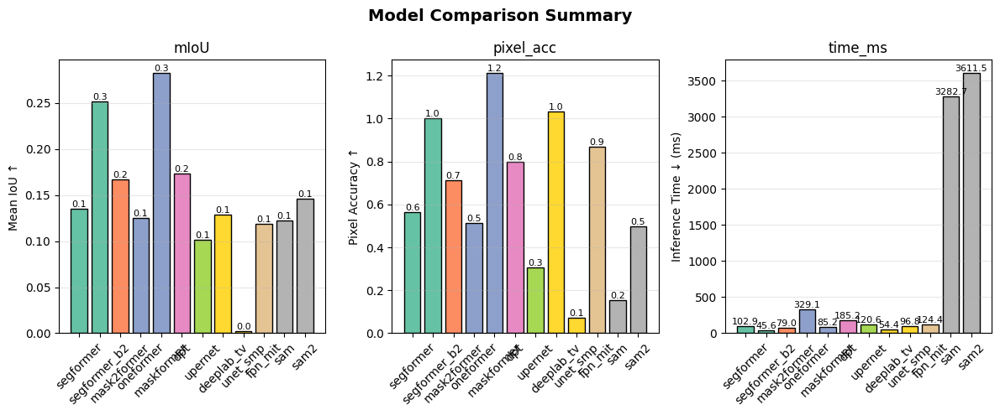

/tmp/ipykernel_1541491/3846482383.py:295: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


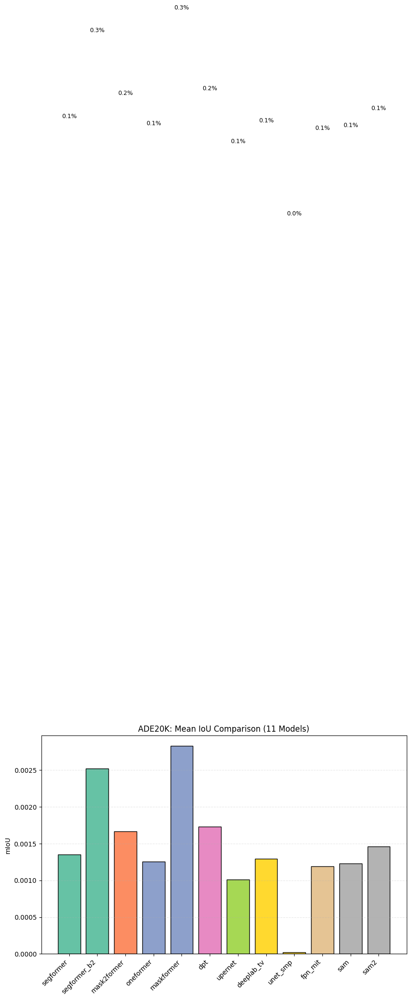

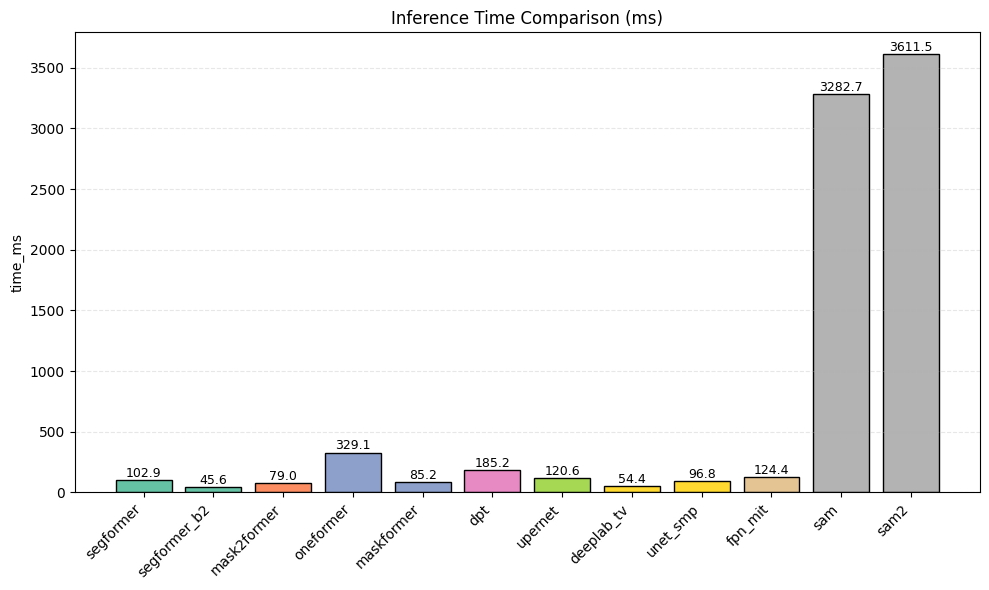

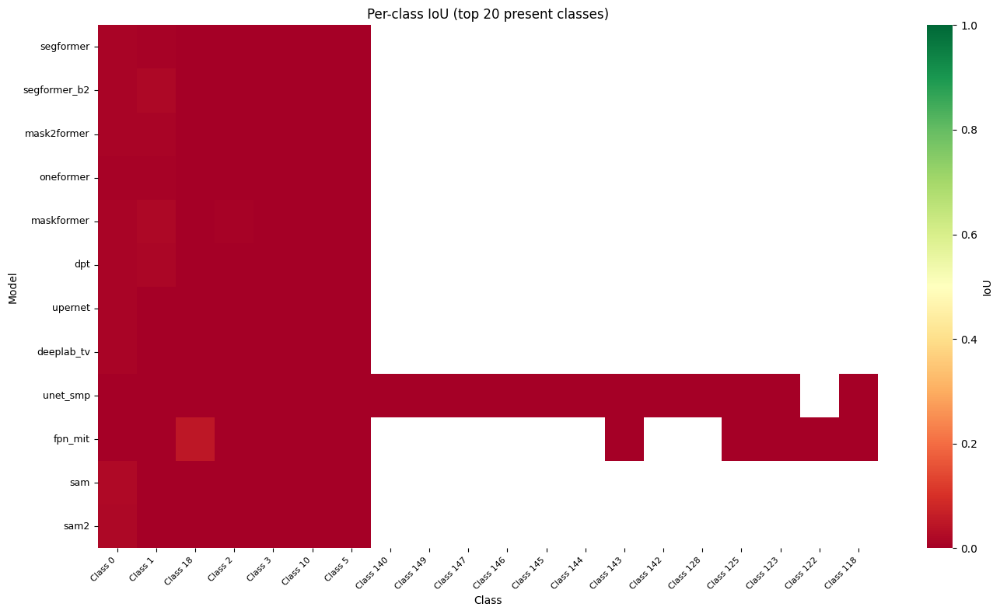


📊 Per-class IoU Statistics:
  Total classes in dataset: 150
  Classes present in GT: 111
  Showing top 20 classes
  Mean IoU (all classes): 0.001


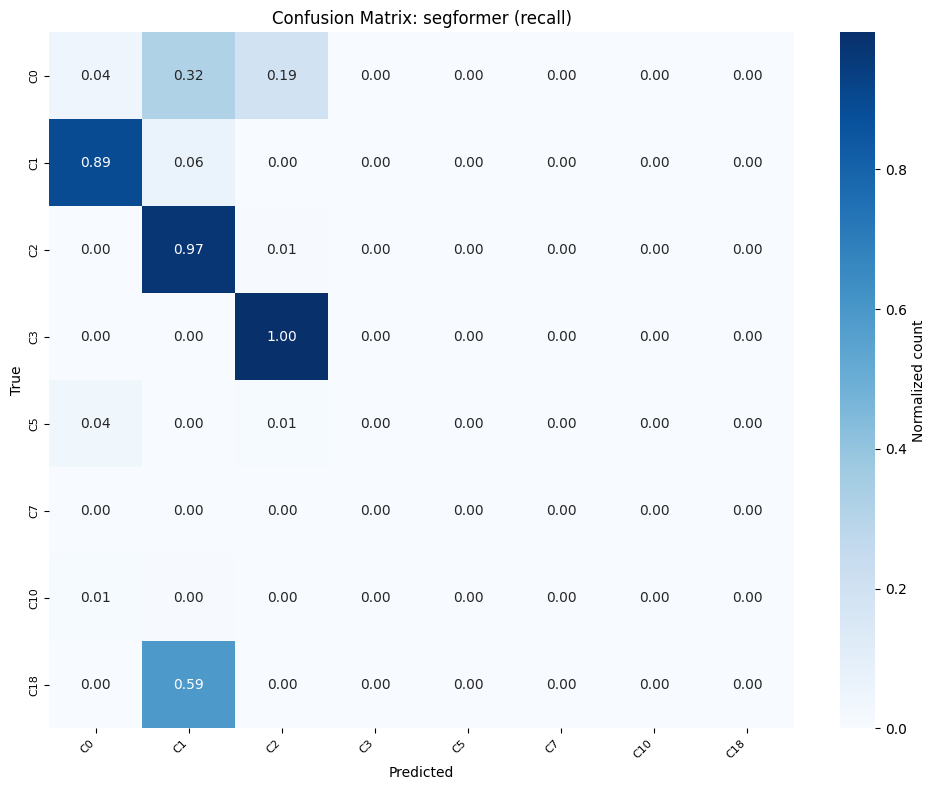

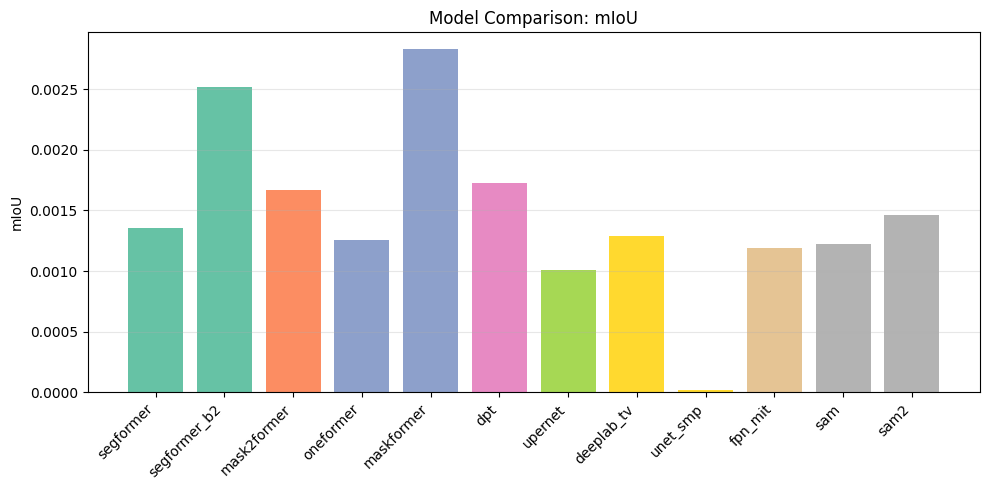

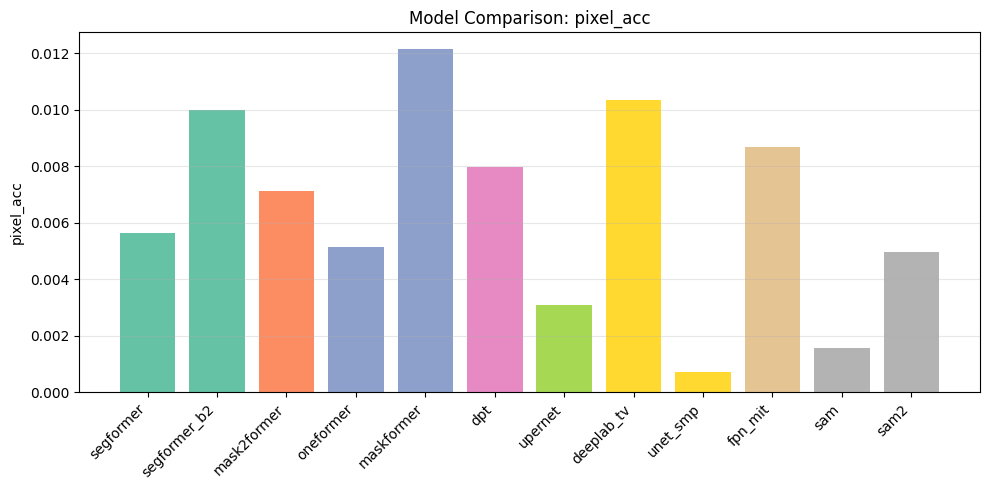

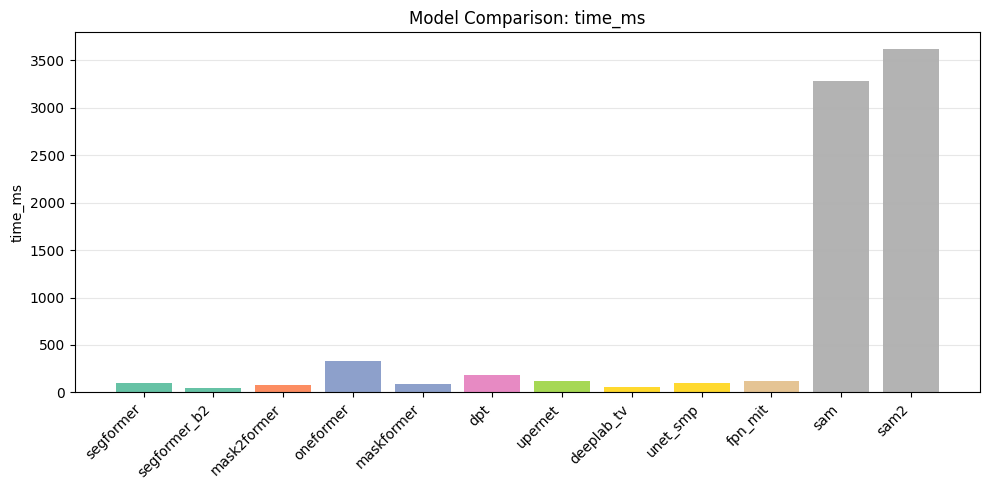


💾 Saving results...
✅ Results saved to ade20k_benchmark_v1/

segformer:
  mIoU: 0.0014
  Time: 102.9 ms
  Classes: 9

segformer_b2:
  mIoU: 0.0025
  Time: 45.6 ms
  Classes: 7

mask2former:
  mIoU: 0.0017
  Time: 79.0 ms
  Classes: 8

oneformer:
  mIoU: 0.0013
  Time: 329.1 ms
  Classes: 8

maskformer:
  mIoU: 0.0028
  Time: 85.2 ms
  Classes: 8

dpt:
  mIoU: 0.0017
  Time: 185.2 ms
  Classes: 10

upernet:
  mIoU: 0.0010
  Time: 120.6 ms
  Classes: 8

deeplab_tv:
  mIoU: 0.0013
  Time: 54.4 ms
  Classes: 1

unet_smp:
  mIoU: 0.0000
  Time: 96.8 ms
  Classes: 95

fpn_mit:
  mIoU: 0.0012
  Time: 124.4 ms
  Classes: 40

sam:
  mIoU: 0.0012
  Time: 3282.7 ms
  Classes: 22

sam2:
  mIoU: 0.0015
  Time: 3611.5 ms
  Classes: 8

RESULTS SUMMARY (sorted by mIoU)
                  mIoU  pixel_acc  f1_weighted      time_ms  unique_classes
maskformer    0.002827   0.012133     0.006426    85.214376             8.0
segformer_b2  0.002519   0.010000     0.003799    45.552492             7.0
dpt    

In [53]:
# === Инициализация бенчмарка ===
bench = SegmentationBenchmark(device="cuda", num_classes=150, ignore_index=255)

# Загрузка всех моделей
print("\n📦 Loading models...")

# Transformer-based
bench.load_segformer("/home/yamshchikov/models/segformer-b5-ready")
print("  ✅ SegFormer-B5")

bench.load_segformer_variant("b2")
print("  ✅ SegFormer-B2 (speed variant)")

bench.load_mask2former("facebook/mask2former-swin-base-ade-semantic")
print("  ✅ Mask2Former-Swin-Base")

bench.load_oneformer("shi-labs/oneformer_ade20k_swin_large")
print("  ✅ OneFormer-Swin-Large")

bench.load_maskformer("facebook/maskformer-resnet50-ade20k-full")
print("  ✅ MaskFormer-Swin-Small")

bench.load_dpt("Intel/dpt-large-ade")
print("  ✅ DPT-Large (Hybrid)")

bench.load_upernet("openmmlab/upernet-convnext-small")
print("  ✅ UPerNet-ConvNeXt-Small")

# CNN-based
bench.load_deeplab()
print("  ✅ DeepLabV3+ ResNet101")

bench.load_unet("resnet34")
print("  ✅ U-Net ResNet34")

bench.load_hrnet("hrnet_w48")
print("  ✅ HRNet-W48")

# Instance-based (SAM family)
bench.load_sam("mobile_sam.pt")
print("  ✅ MobileSAM")

bench.load_sam("sam2_t.pt")  # Авто-загрузка если нет
print("  ✅ SAM2-Tiny")

# Загрузка тестового изображения + ground truth
from huggingface_hub import hf_hub_download
from PIL import Image

print("\n📁 Loading ADE20K test data...")
repo_id = "hf-internal-testing/fixtures_ade20k"
img_path = hf_hub_download(repo_id, "ADE_val_00000001.jpg", repo_type="dataset")
gt_path = hf_hub_download(repo_id, "ADE_val_00000001.png", repo_type="dataset")

test_image = Image.open(img_path).convert("RGB")
ground_truth = np.array(Image.open(gt_path))  # ADE20K: 1→0 индексация

# Конвертация 1-индексации ADE20K → 0-индексация
if ground_truth.min() >= 1:
    ground_truth = ground_truth - 1

print(f"  ✅ Image: {test_image.size}, GT: {ground_truth.shape}")

# Запуск бенчмарка
print("\n🚀 Running benchmark (this may take 10-15 minutes)...")
summary = bench.compare(test_image, gt_mask=ground_truth, alpha=0.6)

# === Визуализация результатов ===
# 1. Бар-чарты по метрикам
# Визуализация
print("\n📊 Generating visualizations...")
# 2. Сводный график всех метрик
bench.plot_all_metrics()
bench.plot_comparison_chart("mIoU", title="ADE20K: Mean IoU Comparison (11 Models)")
bench.plot_comparison_chart("time_ms", title="Inference Time Comparison (ms)")
# 3. Heatmap пер-класс IoU (топ-20 классов)
bench.plot_per_class_iou(top_k=20)

# 4. Матрица ошибок для конкретной модели
bench.plot_confusion_matrix("segformer", normalize='true')
bench.plot_summary(metrics=["mIoU", "pixel_acc", "time_ms"])

# === Сохранение ===
print("\n💾 Saving results...")
bench.save_results("ade20k_benchmark_v1")

# === Ручной доступ к результатам ===
for model_name, res in bench.results.items():
    print(f"\n{model_name}:")
    print(f"  mIoU: {res['metrics'].get('mIoU', 'N/A'):.4f}")
    print(f"  Time: {res['inference_time_ms']:.1f} ms")
    print(f"  Classes: {res['unique_classes']}")

import pandas as pd
df = pd.DataFrame(bench.get_summary()).T.sort_values("mIoU", ascending=False)
print("\n" + "=" * 70)
print("RESULTS SUMMARY (sorted by mIoU)")
print("=" * 70)
print(df.to_string())

# LaTeX таблица для статьи
print("\n" + "=" * 70)
print("LATEX TABLE FOR PAPER")
print("=" * 70)
print(bench.export_latex_table(caption="Comprehensive Semantic Segmentation Benchmark on ADE20K"))

# Сравнение SegFormer variants
if "segformer" in df.index and "segformer_b2" in df.index:
    print("\n" + "=" * 70)
    print("SEGFORMER SPEED-ACCURACY TRADEOFF")
    print("=" * 70)
    sf = df.loc[["segformer", "segformer_b2"], ["mIoU", "time_ms"]]
    sf["mIoU"] = sf["mIoU"] * 100
    print(sf.to_string(float_format="%.2f"))
    print(f"\n💡 B2 is {df.loc['segformer', 'time_ms']/df.loc['segformer_b2', 'time_ms']:.1f}x faster with {df.loc['segformer', 'mIoU']-df.loc['segformer_b2', 'mIoU']:.1f} pp mIoU drop")

print("\n" + "=" * 70)
print("✅ BENCHMARK COMPLETE — Results saved to 'ade20k_11models_comprehensive/'")
print("=" * 70)